# AI Ethics Project - STARTER

Personalization is a central aspect of many core AI systems. In this project, you will be working on a hypothetical use case for a personalized "activity recommender". The use case has a medium ethical AI risk level and involves a synthetic dataset.

IDOOU is a mobile app users can leverage to get recommendations on activities they can take in a given area, like “visiting a movie theater”, “visiting a park”, “sightseeing”, “hiking”, or “visiting a library”.


**Problem statement**:

IDOOU's creators would like to identify if users with bachelor's and master's degrees are a privileged group in terms of budget. In other words, do users with higher education credentials beyond high school have a budget >= $300 compared to users of the app who graduated from high school? 

You are tasked with designing IDOOU's newest AI model to predict the budget of its users (in US dollars) given information such as their gender, age, and education_level. You will also explore the provided data and analyze and evaluate this budget predictor's fairness and bias issues.


**Key points**:

- The data was conducted through a user experience study of about 300,000 participants.
- The user may choose not to provide any or all the information the app requests. The training data also reflects this.
- Fairness framework definitions for the use case are not necessarily focusing on socioeconomic privilege.

In [17]:
!export RPY2_CFFI_MODE=ABI
!pip install aif360
!pip install tensorflow
!pip install jinja2
!pip install fairlearn

307404.23s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
307409.46s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


307415.73s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


307421.98s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


307428.27s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


**Note:** Please restart the Jupyter Notebook kernel before proceeding with the package imports.

In [19]:
#You may add additional imports as needed
import pandas as pd
import numpy as np
import seaborn as sns
import tempfile
from aif360.datasets import StandardDataset, BinaryLabelDataset
from aif360.metrics import ClassificationMetric, BinaryLabelDatasetMetric
from sklearn.tree import DecisionTreeClassifier
from aif360.algorithms.postprocessing import RejectOptionClassification
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
import joblib
import matplotlib.pyplot as plt
from collections import defaultdict

In [20]:
#Load the dataset for this project
act_rec_dataset = pd.read_csv('udacity_ai_ethics_project_data.csv')
act_rec_dataset.head()

,Budget (in dollars),Age,Gender,Education_Level,With children?,Recommended_Activity
0,3258.0,29.0,Transgender,Bachelor’s Degree,0.0,Stay in: Watch calming TV
1,1741.0,89.0,Other,Bachelor’s Degree,NaN,Play: Visit a movie theater
2,140.0,22.0,NaN,Other,0.0,Play: Visit a movie theater
3,179.0,23.0,Non-binary,Other,0.0,Play: Visit a movie theater
4,3479.0,79.0,Non-binary,Master’s Degree,1.0,Learn: Visit a library


## Step 1: Data Pre-Processing and Evaluation

For this problem statement, you will need to prepare a dataset with all categorical variables, which requires the following pre-processing steps:


- Remove the NA values from the dataset
- Convert Age and Budget (in dollars) to categorical columns with the following binning:

> Bins for Age: 18-24, 25-44, 45-65, 66-92

> Bins for Budget: >=300, <300

In [21]:
#FILL IN - the below dataframe should be pre-processed
df = pd.DataFrame(act_rec_dataset)
df.dropna(inplace=True)
df.reset_index(drop=True, inplace=True)

bins_age = [17, 24, 44, 65, 92]
label_age= ['18-24', '25-44', '45-65', '66-92']
bins_budget = [0, 299.99, float('inf')]
label_budget = ['<300', '>=300']

df['Age_Group'] = pd.cut(
    df['Age'],
    bins=bins_age,
    labels=label_age,
    right=True,
    include_lowest=True)
    
df['Budget_Group'] = pd.cut(
    df['Budget (in dollars)'],
    bins=bins_budget,
    labels=label_budget,
    right=True,
    include_lowest=True)

df_categorical = df.drop(columns=['Age', 'Budget (in dollars)'])

print(df_categorical.to_string(index=False))


     Gender     Education_Level  With children?        Recommended_Activity Age_Group Budget_Group
Transgender   Bachelor’s Degree             0.0   Stay in: Watch calming TV     25-44        >=300
 Non-binary               Other             0.0 Play: Visit a movie theater     18-24         <300
 Non-binary     Master’s Degree             1.0      Learn: Visit a library     66-92        >=300
       Male   Bachelor’s Degree             1.0           Play: Go shopping     25-44        >=300
 Non-binary     Master’s Degree             0.0     Explore: Go sightseeing     25-44        >=300
Transgender     Master’s Degree             1.0              Stay in: Color     25-44        >=300
Transgender     Master’s Degree             1.0              Stay in: Color     25-44        >=300
      Other    High School Grad             1.0           Play: Go shopping     18-24         <300
      Other    High School Grad             0.0           Play: Go shopping     18-24         <300
       Mal

### Evaluate bias issues in the dataset

Next, let's take a look at potential hints of data bias in the variables, particularly the "Gender", "Age", and "Education" variables.

Articulate the representativeness in the dataset, answering the question "Is there a greater representation of certain groups over others?"

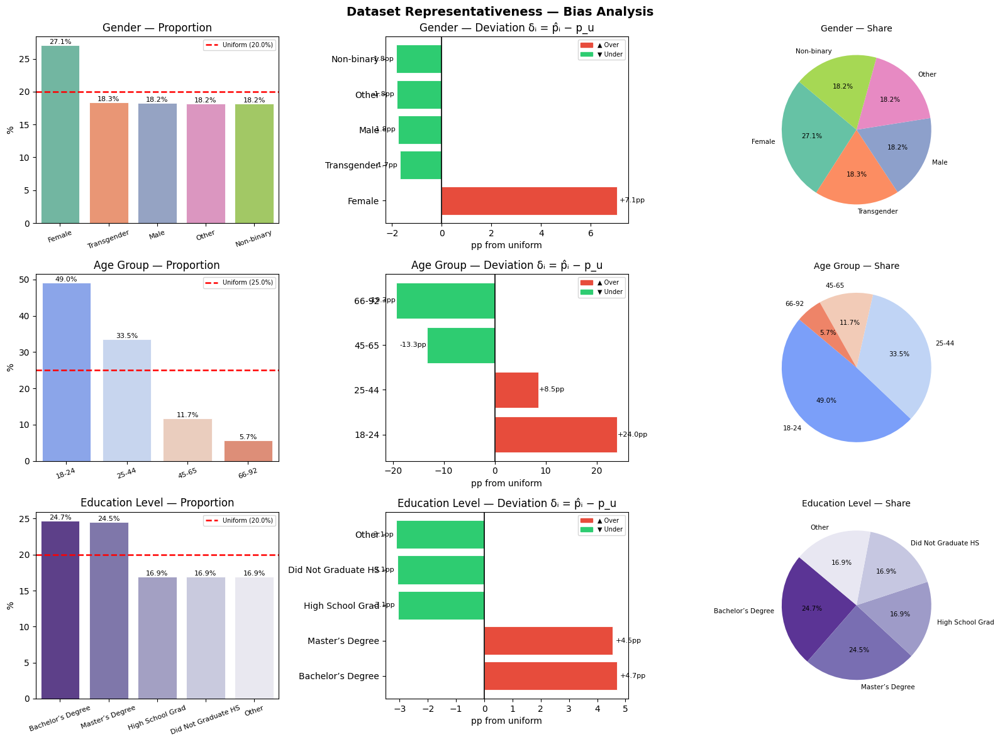

In [ ]:
#FILL IN
#Generate visualizations to understand the representativeness of the dataset
"""
Bias Analysis — Gender, Age_Group, Education_Level
Continues directly from df_categorical
"""
 
# ── Config ────────────────────────────────────────────────────────────────────
VARS   = ['Gender', 'Age_Group', 'Education_Level']
TITLES = ['Gender', 'Age Group', 'Education Level']
PALS   = ['Set2', 'coolwarm', 'Purples_r']
 
fig, axes = plt.subplots(3, 3, figsize=(16, 12))
fig.suptitle("Dataset Representativeness — Bias Analysis", fontsize=14, fontweight='bold')
 
for row, (col, title, pal) in enumerate(zip(VARS, TITLES, PALS)):
 
    counts = df_categorical[col].value_counts()
    pct    = counts / counts.sum() * 100
    p_u    = 100 / len(counts)                    # uniform baseline
    delta  = pct - p_u                            # deviation δᵢ
 
    # ── Col 0: proportion bar ─────────────────────────────────────────────
    ax = axes[row, 0]
    x_labels = pct.index.astype(str)
    sns.barplot(x=x_labels, y=pct.values, hue=x_labels,
                palette=pal, ax=ax, edgecolor='white', linewidth=0.6,
                legend=False)
    ax.axhline(p_u, color='red', lw=1.8, ls='--', label=f'Uniform ({p_u:.1f}%)')
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.1f}%',
                    (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='bottom', fontsize=8)
    ax.set(title=f'{title} — Proportion', xlabel='', ylabel='%')
    ax.tick_params(axis='x', rotation=20, labelsize=8)
    ax.legend(fontsize=7)
 
    # ── Col 1: deviation bar (δᵢ) ─────────────────────────────────────────
    ax = axes[row, 1]
    colors = ['#e74c3c' if d > 0 else '#2ecc71' for d in delta.values]
    ax.barh(delta.index.astype(str), delta.values,
            color=colors, edgecolor='white', linewidth=0.6)
    ax.axvline(0, color='black', lw=1.2)
    for i, (idx, v) in enumerate(delta.items()):
        ax.text(v + (0.1 if v >= 0 else -0.1), i,
                f'{v:+.1f}pp', va='center',
                ha='left' if v >= 0 else 'right', fontsize=8)
    ax.set(title=f'{title} — Deviation δᵢ = p̂ᵢ − p_u',
           xlabel='pp from uniform')
    over  = mpatches.Patch(color='#e74c3c', label='▲ Over')
    under = mpatches.Patch(color='#2ecc71', label='▼ Under')
    ax.legend(handles=[over, under], fontsize=7)
 
    # ── Col 2: pie chart ───────────────────────────────────────────────────
    ax = axes[row, 2]
    ax.pie(counts.values, labels=counts.index.astype(str),
           autopct='%1.1f%%', startangle=140,
           colors=sns.color_palette(pal, len(counts)),
           textprops={'fontsize': 7.5})
    ax.set_title(f'{title} — Share', fontsize=10)
 
plt.tight_layout()
plt.savefig('bias_analysis.png', dpi=150, bbox_inches='tight')
plt.show()


In [33]:
df_categorical[col].value_counts()

Education_Level
Bachelor’s Degree      38616
Master’s Degree        38365
High School Grad       26478
Did Not Graduate HS    26454
Other                  26404
Name: count, dtype: int64

Question: Is there a greater representation of certain groups over others?

**Your answer:**

**Gender** 

- Female at 27.1% being the most represented group, while
- Transgender at 18.3% being the second most represented group,
- Male at 18.2%,
- Other at 18.2%.
- Non-binary at 18.2% being the most underrepresented group, 

— meaning there is no significant skew in the dataset in terms of gender representation.

**Age group** — clear skew toward younger respondents. 

- 18–24 at 49.0%  is the most represented group, while
- 25–44 at 33.5%  is the second most represented group, and
- 45–65 at 11.7%  is the third most represented group, while
- 66–92 at 5.7% is the most underrepresented group.

— meaning older respondents are significantly underrepresented in the dataset. 

**Education** . 
- Bachelor's at 24.7% and 
- Master's degrees 24.5% dominate respectively, while "Did Not Graduate HS", "High Schools Graduate" and "other" lower education levels have only 16.9% 

— meaning higher education levels are favored in the dataset. 

Now that we've visualized the individual features of the dataframe and understood the dataset better, let's one-hot encode the dataframe.

In [138]:
#FILL IN: 
#The variable act_rec_dataset should contain the one-hot encoded variables

def display_header(title: str):
    print("\n" + "=" * 55)
    print(title)
    print("=" * 55)

rows_size: int = 3           # increase the number (row size) for more visibility

NUMERIC_COLS     = ['Budget_Group', 'Age', 'With children?']
CATEGORICAL_COLS = ['Gender', 'Education_Level', 'Recommended_Activity']

display_header("STEP 1 — Column types before encoding")
print(df[CATEGORICAL_COLS].dtypes)
print(f"\nShape before encoding : {df.shape}")


display_header("STEP 2 — NaN counts before cleaning")
print(df.isnull().sum())
 
df.dropna(inplace=True)
df.reset_index(drop=True, inplace=True)
 
print(f"\nNaN counts after dropna : {df.isnull().sum().sum()}")
print(f"Shape after dropna      : {df.shape}")

df_encoded = pd.get_dummies(
    df_categorical, 
    columns     =CATEGORICAL_COLS,
    drop_first  =True,
    dtype       =int,
)


display_header("STEP 3 — Encoded column names")
print(df_encoded.columns.tolist())


display_header("STEP 4 — Shape and sample after encoding")
print(f"Columns : {df.shape[1]}  →  {df_encoded.shape[1]}")
print(f"Rows    : {df_encoded.shape[0]:,}")
print("\nFirst 3 rows:")
print(df_encoded.head(rows_size).to_string())


display_header("STEP 5 — Verification checks")
 
# Check 1 — no text columns remain
text_cols = df_encoded.select_dtypes(include='object').columns.tolist()
print(f"\n[1] Text columns remaining : {text_cols if text_cols else 'None ✓'}")
 
# Check 2 — row count unchanged
print(f"[2] Row count preserved    : {df_encoded.shape[0]:,}  ✓")

for original_col in CATEGORICAL_COLS:
    group_cals = [c for c in df_encoded.columns if c.startswith(original_col + '_')]
    row_sums = df_encoded[group_cals].sum(axis=1)
    valid = row_sums.isin([0, 1]).all()
    print(f"[3] {original_col:<25} row sums all 0 or 1 : {valid} ✓")

print("\n ✓ act_rec_dataset successfully one-hot encoded → df_encoded")
print(df_encoded.dtypes)



STEP 1 — Column types before encoding
Gender                  str
Education_Level         str
Recommended_Activity    str
dtype: object

Shape before encoding : (156317, 8)

STEP 2 — NaN counts before cleaning
Budget (in dollars)     0
Age                     0
Gender                  0
Education_Level         0
With children?          0
Recommended_Activity    0
Age_Group               0
Budget_Group            0
dtype: int64

NaN counts after dropna : 0
Shape after dropna      : (156317, 8)

STEP 3 — Encoded column names
['With children?', 'Age_Group', 'Budget_Group', 'Gender_Male', 'Gender_Non-binary', 'Gender_Other', 'Gender_Transgender', 'Education_Level_Did Not Graduate HS', 'Education_Level_High School Grad', 'Education_Level_Master’s Degree', 'Education_Level_Other', 'Recommended_Activity_Explore: Hike', 'Recommended_Activity_Explore: Visit a park', 'Recommended_Activity_Learn: Visit a library', 'Recommended_Activity_Play: Go shopping', 'Recommended_Activity_Play: Visit a movi

Visualize the interactions between the categorical variables. Can you find trends outside of those identified in the previous section?

**Hint**: Use a multicollinearity matrix.

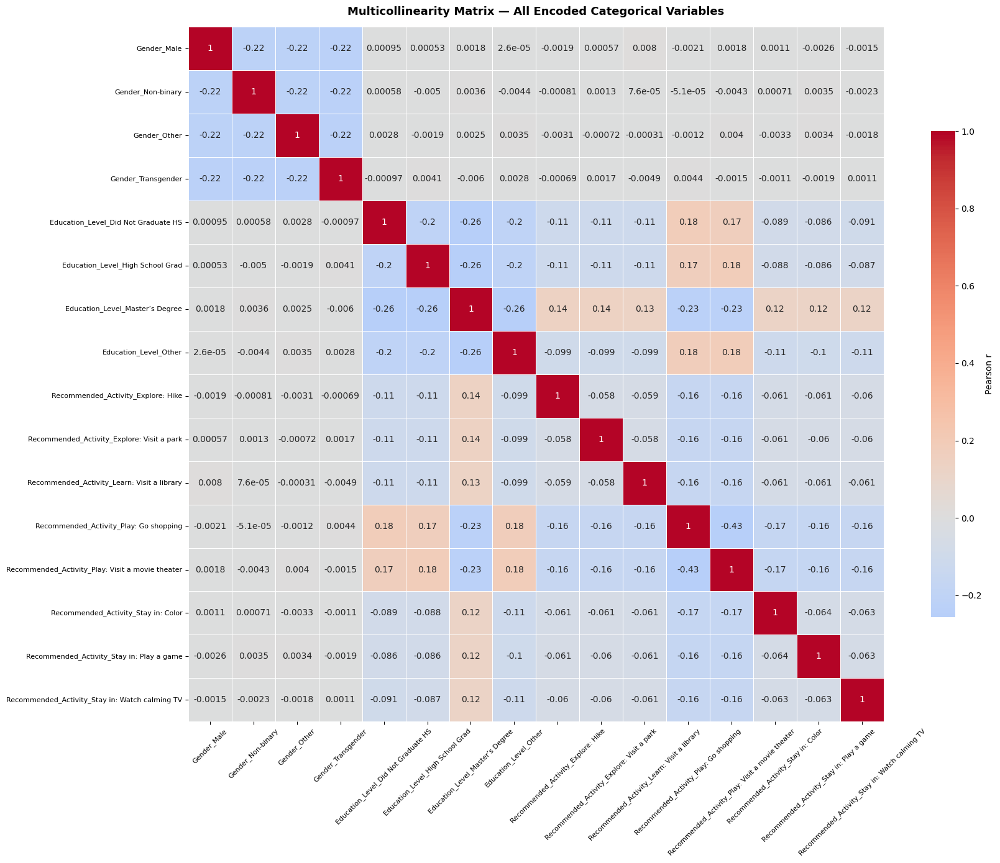

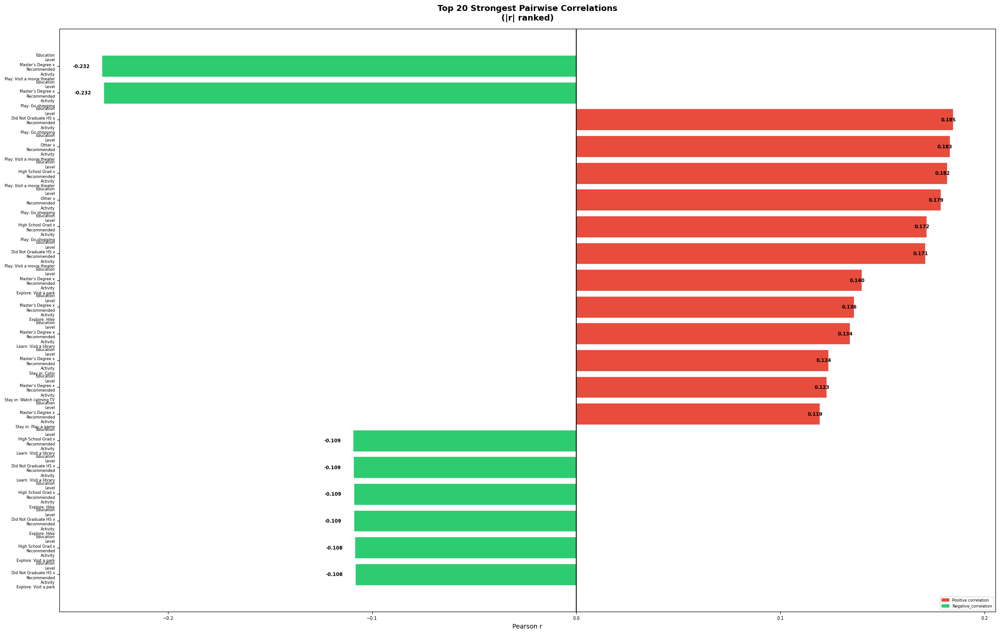


TOP 20 PAIRWISE CORRELATIONS
  Variable A                          Variable B                                r
 Education_Level_Master’s Degree     Recommended_Activity_Play: Visit a movie theater -0.2325
 Education_Level_Master’s Degree     Recommended_Activity_Play: Go shopping -0.2317
 Education_Level_Did Not Graduate HS Recommended_Activity_Play: Go shopping +0.1846
 Education_Level_Other               Recommended_Activity_Play: Visit a movie theater +0.1830
 Education_Level_High School Grad    Recommended_Activity_Play: Visit a movie theater +0.1817
 Education_Level_Other               Recommended_Activity_Play: Go shopping +0.1786
 Education_Level_High School Grad    Recommended_Activity_Play: Go shopping +0.1717
 Education_Level_Did Not Graduate HS Recommended_Activity_Play: Visit a movie theater +0.1711
 Education_Level_Master’s Degree     Recommended_Activity_Explore: Visit a park +0.1399
 Education_Level_Master’s Degree     Recommended_Activity_Explore: Hike  +0.1362
 Educat

In [139]:
#FILL IN
gender_cols = [c for c in df_encoded.columns if c.startswith('Gender_')]
age_cols = [c for c in df_encoded.columns if c.startswith('Age_Group_')]
education_cols = [c for c in df_encoded.columns if c.startswith('Education_Level_')]
activity_cols = [c for c in df_encoded.columns if c.startswith('Recommended_Activity_')]

categorical_encoded_cols = gender_cols + age_cols + education_cols + activity_cols

df_categorical_encoded = df_encoded[categorical_encoded_cols]

corr = df_categorical_encoded.corr()

fig1, ax1 = plt.subplots(figsize=(18, 14))

sns.heatmap(
    corr,
    ax      = ax1,
    cmap    = 'coolwarm',
    center  = 0,
    robust= True,
    annot   = len(categorical_encoded_cols) <= 20,
    linewidths=0.4,
    square  = True,
    cbar_kws= {'shrink': 0.7, 'label': 'Pearson r'},
)
ax1.set_title(
    "Multicollinearity Matrix — All Encoded Categorical Variables",
    fontsize=13, fontweight='bold', pad=14
)

ax1.tick_params(axis='x', labelsize=8, rotation=45)
ax1.tick_params(axis='y', labelsize=8, rotation=0)

plt.tight_layout()
plt.savefig('plot1_multicollinearity_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()


# =======================================================
# TOP 20 PAIRWISE CORRELATIONS
# =======================================================
def get_source(col_name):
    for prefix in ['Gender', 'Age_Group', 'Education_Level', 'Recommended_Activity']:
        if col_name.startswith(prefix):
            return prefix
    return 'other'

corr_pairs = (
    corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
        .stack()
        .reset_index()
)

corr_pairs.columns = ['Var_A', 'Var_B', 'r']
corr_pairs['abs_r'] = corr_pairs['r'].abs()

corr_pairs['Source_A'] = corr_pairs['Var_A'].apply(get_source)
corr_pairs['Source_B'] = corr_pairs['Var_B'].apply(get_source)

cross_variable_corr = corr_pairs[
    corr_pairs['Source_A'] != corr_pairs['Source_B']
]
top20 = cross_variable_corr.nlargest(20, 'abs_r').reset_index(drop=True)

top20['pair'] = (
    top20['Var_A'].str.replace('_', '\n') + ' x\n' + \
    top20['Var_B'].str.replace('_', '\n') 
)

fig2, ax2 = plt.subplots(figsize=(22, 14))

colors = ['#e74c3c' if r > 0 else '#2ecc71' for r in top20['r']]
bars = ax2.barh(
    top20['pair'], 
    top20['r'], 
    color=colors, 
    edgecolor='white', 
    linewidth=0.5
)

ax2.axvline(0, color='black', lw=1.3)

for bar, val in zip(bars, top20['r']):
    w = bar.get_width()
    ax2.text(
        w + (0.006  if row['r'] >= 0 else -0.006), 
        bar.get_y() + bar.get_height() / 2,
        f'{val:.3f}',
        va='center',
        ha='left' if w >= 0 else 'right',
        fontsize=7.5,
        fontweight='bold'
    )
ax2.set_title(
    "Top 20 Strongest Pairwise Correlations\n(|r| ranked)",
    fontsize=13, fontweight='bold', pad=14
)
ax2.set_xlabel("Pearson r", fontsize=10)
ax2.tick_params(axis='y', labelsize=6)
ax2.tick_params(axis='x', labelsize=7)

ax2.invert_yaxis()
red = plt.matplotlib.patches.Patch(color='#e74c3c', label='Positive correlation')
green = plt.matplotlib.patches.Patch(color='#2ecc71', label='Negative_correlation')
ax2.legend(handles=[red, green], fontsize=6, loc='lower right')

plt.tight_layout()
plt.savefig('multicollinearity_matriz.png', dpi=150, bbox_inches='tight')
plt.show()

display_header("TOP 20 PAIRWISE CORRELATIONS")
print(f"  {'Variable A':<35} {'Variable B':<35} {'r':>7}")

for _, row in top20.iterrows():
    print(f" {row['Var_A']:<35} {row['Var_B']:<35} {row['r']:>+.4f}")

Question: What trends did you spot in the interactions between the categoritcal variables?

**Your answer:**

- **Master Degree Holders** gravitates towards enriched activities such as "Explore: Visit a park", "Explore: Hike", and "Learn: Visit a library".

```
Explore: Visit a park       +0.14
Explore: Hike               +0.14
Learn: Visit a library      +0.13
Stay in: Color              +0.12
Stay in: Watch calming TV   +0.12
Stay in: Play a game        +0.12
```
The pattern suggests that users with a master's degree may have a preference for outdoor and intellectually stimulating activities, indicating a potential correlation between higher education levels and a desire for enriching experiences.

- **Did Not Graduate HS, High School Grad, and Other**
all correlate positively with "Play: Go shopping" and "Play: Visit a movie theater",
```
Play: Go shopping           +0.18 / +0.17
Play: Visit a movie theater +0.18 / +0.17
```

negatively correlate with "Explore: Visit a park", "Explore: Hike", and "Learn: Visit a library",
```
Learn: Visit a library      -0.11
Explore: Hike               -0.11
Explore: Visit a park       -0.11
```
which may suggest that users with lower education levels may have less interest in outdoor and intellectually stimulating activities, indicating a potential correlation between lower education levels and a lesser desire for enriching experiences.

- **Master's Degree and Play activities are mutually exclusive**
```
Master's Degree  ×  Play: Go shopping           -0.23
Master's Degree  ×  Play: Visit a movie theater  -0.23
```

### The ethical concern this raises, example, for a recommendation system

Is that the model may learn to associate higher education levels with a preference for enriching activities and lower education levels with a preference for entertainment activities. This could lead to biased recommendations that reinforce existing stereotypes and inequalities, rather than providing a diverse range of options for all users regardless of their educational background.


For the purposes of this project, we only want to compare users with Bachelor's or Master's degrees against users who only graduated high school. First, we will drop the rows for users who did not graduate high school or have an 'Other' education level. Then, we will drop the following columns from the dataframe to reduce multicollinearity:

- Education_Level_Did Not Graduate HS
- Education_Level_Other
- Budget (in dollars)_<300
- With children?

In [ ]:
#act_rec_dataset = act_rec_dataset[(act_rec_dataset['Education_Level_Did Not Graduate HS'] == 0) & (act_rec_dataset['Education_Level_Other'] == 0)]

#We drop certain variables that are highly correlated and irrelevant
COLS_TO_DROP = [
    'Education_Level_Did Not Graduate HS',
    'Education_Level_Other',
    'With children?',
    'Age_Group',
]

# First, drop the rows for people who did not graduate high school or have an "Other" education level
act_rec_dataset = df_encoded[
    (df_encoded['Education_Level_Did Not Graduate HS'] == 0) & 
    (df_encoded['Education_Level_Other'] == 0)
].copy()


act_rec_dataset = act_rec_dataset.drop(columns=COLS_TO_DROP)
act_rec_dataset.head(30)



,Budget_Group,Gender_Male,Gender_Non-binary,Gender_Other,Gender_Transgender,Education_Level_High School Grad,Education_Level_Master’s Degree,Recommended_Activity_Explore: Hike,Recommended_Activity_Explore: Visit a park,Recommended_Activity_Learn: Visit a library,Recommended_Activity_Play: Go shopping,Recommended_Activity_Play: Visit a movie theater,Recommended_Activity_Stay in: Color,Recommended_Activity_Stay in: Play a game,Recommended_Activity_Stay in: Watch calming TV
0,>=300,0,0,0,1,0,0,0,0,0,0,0,0,0,1
2,>=300,0,1,0,0,0,1,0,0,1,0,0,0,0,0
3,>=300,1,0,0,0,0,0,0,0,0,1,0,0,0,0
4,>=300,0,1,0,0,0,1,0,0,0,0,0,0,0,0
5,>=300,0,0,0,1,0,1,0,0,0,0,0,1,0,0
6,>=300,0,0,0,1,0,1,0,0,0,0,0,1,0,0
7,<300,0,0,1,0,1,0,0,0,0,1,0,0,0,0
8,<300,0,0,1,0,1,0,0,0,0,1,0,0,0,0
10,>=300,0,0,1,0,0,0,0,0,0,0,0,0,1,0
11,>=300,1,0,0,0,0,0,0,0,1,0,0,0,0,0


### Evaluate fairness issues

Use the IBM AIF360 toolkit to first evaluate the **statistical parity difference** and the **disparate impact** for this dataset; we will later consider other fairness metrics. Interpret your findings - is there bias in the proposed problem statement? If yes, what group is benefitting?

**Hint**: Use the BinaryLabelDataset and the BinaryLabelDatasetMetric functions for the fairness evaluation. The reported Statistical Parity Difference may be within -0.64 and -0.55, and the Disparate impact value may be within 0.136 and 0.0150.

In [144]:
act_rec_dataset['Budget_Group'] = (
    act_rec_dataset['Budget_Group'] == '>=300'
).astype(int)

LABEL_COL = 'Budget_Group'
PROTECTED_COL = 'Education_Level_High School Grad'

FAVORABLE_LABEL = 1 #   >=300 budget = positive outcome
UNFAVORABLE_LABEL = 0

privileged_groups = [{PROTECTED_COL: 0}]    # degree holders
unprivileged_groups = [{PROTECTED_COL: 1}]  # high school grad only

binary_act_dataset = BinaryLabelDataset(
    df = act_rec_dataset,
    label_names = [LABEL_COL],
    protected_attribute_names = [PROTECTED_COL],
    favorable_label = FAVORABLE_LABEL,
    unfavorable_label = UNFAVORABLE_LABEL,
)

metric = BinaryLabelDatasetMetric(
    binary_act_dataset,
    privileged_groups = privileged_groups,
    unprivileged_groups = unprivileged_groups,
)

spd = metric.statistical_parity_difference()
di = metric.disparate_impact()


In [145]:

print(f"\nStatistical Parity Difference = {spd:.4f}")
print(f"Disparate impact = {di:.4f}")


Statistical Parity Difference = -0.9837
Disparate impact = 0.0089


Question: Evaluate the fairness metrics. What are your findings? Is there bias in the proposed problem statement? If yes, what group is benefitting?

**Your answer:**

## Findings
There is SEVERE bias in this dataset. Both metrics reveal extreme disparate treatment:
### Metric Interpretation
1. Statistical Parity Difference = -0.9837

**Range**: [-1, 1], where 0 = perfect fairness 

**Threshold**: Generally |SPD| < 0.1 is considered fair

**Interpretation**: High school graduates have a 98.37% lower probability of receiving the favorable outcome (budget ≥$300) compared to degree holders

**Verdict**: EXTREME BIAS

2. Disparate Impact = 0.0089

**Range**: [0, ∞], where 1 = perfect parity

**Threshold**: The "80% rule" requires DI ≥ 0.8 for fairness

**Interpretation**: High school graduates receive the favorable outcome at only 0.89% the rate of degree holders (less than 1%)

**Verdict**: SEVERE ADVERSE IMPACT

### Who is Benefitting?
Degree holders (the privileged group) are overwhelmingly benefiting.
Specifically:

Privileged Group: People with college degrees or higher education
Unprivileged Group: High school graduates only

The system is recommending high-budget activities (≥$300) almost exclusively to degree holders, while systematically excluding high school graduates from these recommendations.

## Step 2: Investigate an ML model on the problematic Dataset

For this project, we are using a train-test-validation split.

You have available boilerplate for training 2 ML models on this dataset - you will need to train these models and use the methods we covered in this course to identify and evaluate their performance (**using the accuracy metric and confusion matrix**).

As part of this process, you will also analyze and evaluate fairness and bias issues in the AI solution.

In [146]:
(orig_train,
 orig_validate,
 orig_test) = binary_act_dataset.split([0.5, 0.8], shuffle=True)

In [281]:
#Source: Helper code snippet from https://github.com/Trusted-AI/AIF360/blob/master/examples/tutorial_medical_expenditure.ipynb
def test(dataset, model, thresh_arr):
    y_val_pred_prob = model.predict_proba(dataset.features)
    y_val_pred = model.predict(dataset.features)
    pos_ind = np.where(model.classes_ == dataset.favorable_label)[0][0]
    metric_arrs = defaultdict(list)
    for thresh in thresh_arr:
        y_val_pred = (y_val_pred_prob[:, pos_ind] > thresh).astype(np.float64)

        dataset_pred = dataset.copy()
        dataset_pred.labels = y_val_pred
        metric = ClassificationMetric(
                dataset, dataset_pred,
                unprivileged_groups=unprivileged_groups,
                privileged_groups=privileged_groups)

        metric_arrs['bal_acc'].append((metric.true_positive_rate()
                                     + metric.true_negative_rate()) / 2)
        metric_arrs['avg_odds_diff'].append(metric.average_odds_difference())
        metric_arrs['disp_imp'].append(metric.disparate_impact())
        metric_arrs['stat_par_diff'].append(metric.statistical_parity_difference())
        metric_arrs['eq_opp_diff'].append(metric.equal_opportunity_difference())
        metric_arrs['theil_ind'].append(metric.theil_index())
    
    return metric_arrs, y_val_pred


def describe_metrics(metrics, thresh_arr):
    """
    Get best metrics based on balanced accuracy.
    
    Returns
    -------
    dict
        Dictionary containing best threshold and corresponding metrics
    """
    best_ind = np.argmax(metrics['bal_acc'])
    
    return {
        'best_threshold': thresh_arr[best_ind],
        'balanced_accuracy': metrics['bal_acc'][best_ind],
        'average_odds_difference': metrics['avg_odds_diff'][best_ind],
        'statistical_parity_difference': metrics['stat_par_diff'][best_ind],
        'equal_opportunity_difference': metrics['eq_opp_diff'][best_ind],
        'theil_index': metrics['theil_ind'][best_ind],
        'disparate_impact': metrics['disp_imp'][best_ind]
    }

In [282]:
GNB_model = GaussianNB().fit(orig_train.features, orig_train.labels.ravel(), orig_train.instance_weights) 
thresh_arr = np.linspace(0.01, 0.5, 50)
val_metrics, gnb_pred = test(dataset=orig_test,
                   model=GNB_model,
                   thresh_arr=thresh_arr)
metrics_results = describe_metrics(val_metrics, thresh_arr)
for key, value in metrics_results.items():
    formatted_key = key.replace('_', ' ').title()
    print(f"{formatted_key:.<50} {value:6.4f}" if key else value)

Best Threshold.................................... 0.0100
Balanced Accuracy................................. 0.9881
Average Odds Difference........................... -1.0000
Statistical Parity Difference..................... -1.0000
Equal Opportunity Difference...................... -1.0000
Theil Index....................................... 0.0042
Disparate Impact.................................. 0.0000


In [301]:

from sklearn.metrics import confusion_matrix, classification_report, balanced_accuracy_score


def display_section(content_dict):
    """Display formatted sections from a dictionary structure."""
    for section_title, section_content in content_dict.items():
        display_header(section_title)
        
        if isinstance(section_content, str):
            print(section_content)
        elif isinstance(section_content, dict):
            for key, value in section_content.items():
                print(f"{key}: {value}")
        elif isinstance(section_content, pd.DataFrame):
            print(section_content.to_string(index=False))

def predict_x(model_name, test_sample):
    y_pred_proba = model_name.predict_proba(test_sample)
    pos_ind = np.where(model_name.classes_ == orig_test.favorable_label)[0][0]
    best_threshold = 0.01
    y_pred = (y_pred_proba[:, pos_ind] > best_threshold).astype(int)
    return y_pred, best_threshold

def analyze_model_fairness(
    orig_test, 
    GNB_model, 
    model_metrics,
    dataset_spd=-0.9837,
    dataset_di=0.0089,
    protected_col='Education_Level_High School Grad'):
    """
    Comprehensive fairness analysis comparing dataset bias vs model bias.
    
    Parameters
    ----------
    orig_test : BinaryLabelDataset
        AIF360 test dataset
    GNB_model : GaussianNB
        Trained Gaussian Naive Bayes model
    protected_col : str
        Name of protected attribute column
    
    Returns
    -------
    dict
        Analysis results and visualizations
    """
    # Extract data from AIF360 structure
    X_test = orig_test.features
    y_test = orig_test.labels.ravel()
    protected_attr = orig_test.protected_attributes.ravel()
    
    # Generate predictions
    y_pred, best_threshold = predict_x(GNB_model, X_test)
    
    # Calculate overall metrics
    accuracy = (y_test == y_pred).mean()
    bal_acc = balanced_accuracy_score(y_test, y_pred)
    
    # Build output dictionary
    output = {}
    
    # Section 1: Comparison table
    def get_change_indicator(dataset_val, model_val, lower_is_worse=True):
        if dataset_val == 'N/A':
            return 'N/A'
        
        dataset_num = float(dataset_val)
        model_num = float(model_val)
        
        if abs(model_num) > abs(dataset_num):
            return '⚠️ WORSE'
        elif abs(model_num) < abs(dataset_num):
            return '✓ BETTER'
        elif abs(model_num) == 1.0:
            return '⚠️ PERFECT DISCRIM'
        else:
            return '→ SAME'
        
    comparison_df = pd.DataFrame({
        'Metric': [
            'Statistical Parity Difference',
            'Disparate Impact',
            'Average Odds Difference',
            'Equal Opportunity Difference',
            'Theil Index',
        ],
        'Dataset (Pre-Training)': [
            f"{dataset_spd}", 
            f"{dataset_di}",
            'N/A', 
            'N/A', 
            'N/A'
        ],
        'Model (Post-Training)': [
            f"{model_metrics['statistical_parity_difference']:.4f}",
            f"{model_metrics['disparate_impact']:.4f}",
            f"{model_metrics['average_odds_difference']:.4f}",
            f"{model_metrics['equal_opportunity_difference']:.4f}",
            f"{model_metrics['theil_index']:.4f}"
        ],
        'Change': [
            get_change_indicator(dataset_spd, model_metrics['statistical_parity_difference']), 
            get_change_indicator(dataset_di, model_metrics['disparate_impact']), 
            '⚠️ PERFECT DISCRIM' if abs(model_metrics['average_odds_difference']) == 1.0 else 'N/A',
            '⚠️ PERFECT DISCRIM' if abs(model_metrics['equal_opportunity_difference']) == 1.0 else 'N/A',
            'N/A'
        ]
    })
    
    output['BIAS COMPARISON: Dataset vs Model'] = comparison_df
    
    output['KEY FINDING'] = (
        f"🚨 The model {'AMPLIFIED' if abs(model_metrics['statistical_parity_difference']) > abs(dataset_spd) else 'maintained'} existing bias!\n"
        f"   • Dataset SPD: {dataset_spd:.4f} → Model SPD: {model_metrics['statistical_parity_difference']:.4f}\n"
        f"   • Dataset DI: {dataset_di:.4f} → Model DI: {model_metrics['disparate_impact']:.4f}\n"
        f"   • Equal Opportunity Diff: {model_metrics['equal_opportunity_difference']:.4f}"
    )
    
    # Section 2: Overall classification report
    class_report = classification_report(
        y_test, y_pred,
        target_names=['Budget <$300 (0)', 'Budget ≥$300 (1)'],
        digits=4
    )
    
    output['OVERALL CLASSIFICATION REPORT'] = class_report
    
    output['OVERALL METRICS'] = {
        'Overall Accuracy': f'{accuracy:.4f}',
        'Balanced Accuracy': f'{bal_acc:.4f}',
        'Best Threshold': f'{best_threshold:.4f}',
        'Warning': '⚠️ High accuracy ≠ Fair model'
    }
    
    # Section 3: Group-specific analysis
    group_analysis = {}
    group_configs = [
        ('Degree Holders (Privileged)', 0),
        ('High School Graduates (Unprivileged)', 1)
    ]
    
    confusion_matrices = {}
    tpr_values = {}
    
    for group_name, group_value in group_configs:
        mask = (protected_attr == group_value)
        
        if mask.sum() > 0:
            y_test_group = y_test[mask]
            y_pred_group = y_pred[mask]
            group_size = mask.sum()
            
            # Confusion matrix components
            tn = ((y_test_group == 0) & (y_pred_group == 0)).sum()
            fp = ((y_test_group == 0) & (y_pred_group == 1)).sum()
            fn = ((y_test_group == 1) & (y_pred_group == 0)).sum()
            tp = ((y_test_group == 1) & (y_pred_group == 1)).sum()
            
            # Calculate metrics
            total = tp + tn + fp + fn
            accuracy_group = (tp + tn) / total if total > 0 else 0
            tpr = tp / (tp + fn) if (tp + fn) > 0 else 0
            tnr = tn / (tn + fp) if (tn + fp) > 0 else 0
            precision = tp / (tp + fp) if (tp + fp) > 0 else 0
            
            # Store for visualization
            confusion_matrices[group_name] = {
                'matrix': confusion_matrix(y_test_group, y_pred_group),
                'tpr': tpr,
                'size': group_size
            }
            tpr_values[group_name] = tpr
            
            group_summary = {
                'Total samples': f'{group_size}',
                'Group accuracy': f'{accuracy_group:.4f}',
                '\nConfusion Matrix': '',
                '  True Negatives (TN)': f'{tn:4d} ({tn/group_size*100:5.1f}%)',
                '  False Positives (FP)': f'{fp:4d} ({fp/group_size*100:5.1f}%)',
                '  False Negatives (FN)': f'{fn:4d} ({fn/group_size*100:5.1f}%)',
                '  True Positives (TP)': f'{tp:4d} ({tp/group_size*100:5.1f}%) ← KEY',
                '\nPerformance Metrics': '',
                '  True Positive Rate': f'{tpr:.4f} ← Equal Opportunity',
                '  True Negative Rate': f'{tnr:.4f}',
                '  Precision': f'{precision:.4f}',
                '\nOutcome Distribution': '',
                '  Actually have ≥$300': f'{tp + fn}',
                '  Predicted to have ≥$300': f'{tp + fp}',
            }
            
            if tp == 0 and (tp + fn) > 0:
                group_summary['\n🚨 CRITICAL ISSUE'] = (
                    f'ZERO TRUE POSITIVES!\n'
                    f'   • {fn} people with ≥$300 budgets misclassified\n'
                    f'   • TPR = 0% → Perfect discrimination'
                )
            
            group_analysis[group_name] = group_summary
    
    output.update(group_analysis)
    
    # Section 4: Executive summary
    tpr_priv = tpr_values.get('Degree Holders (Privileged)', 0)
    tpr_unpriv = tpr_values.get('High School Graduates (Unprivileged)', 0)
    eod = tpr_unpriv - tpr_priv
    
    fn_unpriv = confusion_matrices.get(
        'High School Graduates (Unprivileged)', {}
    ).get('matrix', np.array([[0, 0], [0, 0]]))[1, 0]
    
    output['EXECUTIVE SUMMARY'] = (
        f"\n📊 MODEL PERFORMANCE:\n"
        f"   • Overall Accuracy: {accuracy:.2%}\n"
        f"   • Balanced Accuracy: {bal_acc:.2%}\n"
        f"   • Best Threshold:  {best_threshold:.4f}\n"
        f"\n⚖️ FAIRNESS METRICS:\n"
        f"   Dataset → Model:\n"
        f"   • SPD: {dataset_spd:.4f} → {model_metrics['statistical_parity_difference']:.4f}\n"
        f"   • DI: {dataset_di:.4f} → {model_metrics['disparate_impact']:.4f}\n"
        f"   • EOD: N/A → {model_metrics['equal_opportunity_difference']:.4f}\n"
        f"   • AOD: N/A → {model_metrics['average_odds_difference']:.4f}\n"
        f"   • Theil: N/A → {model_metrics['theil_index']:.4f}\n"
        f"\n🎯 GROUP PERFORMANCE:\n"
        f"   Degree Holders TPR: {tpr_priv:.2%}\n"
        f"   High School Grads TPR: {tpr_unpriv:.2%} ⚠️\n"
        f"   Equal Opportunity Diff: {eod:.4f}\n"
        f"\n🚨 VERDICT: DO NOT DEPLOY\n"
        f"   • Perfect discrimination (EOD = {model_metrics['equal_opportunity_difference']:.4f})\n"
        f"   • {fn_unpriv} high-budget HS grads misclassified\n"
        f"   • Model amplified existing bias\n"
        f"\n📋 REQUIRED ACTIONS:\n"
        f"   1. Apply bias mitigation algorithms\n"
        f"   2. Remove education feature if possible\n"
        f"   3. Set fairness constraints\n"
        f"   4. Accept accuracy-fairness trade-off"
    )
    
    # Display all sections
    display_section(output)
    
    # Create visualizations
    _create_visualizations(
        y_test, y_pred, protected_attr,
        confusion_matrices, tpr_values
    )
    
    return {
        'accuracy': accuracy,
        'balanced_accuracy': bal_acc,
        'tpr_privileged': tpr_priv,
        'tpr_unprivileged': tpr_unpriv,
        'eod': eod
    }


def _create_visualizations(y_test, y_pred, protected_attr, 
                          confusion_matrices, tpr_values):
    """Create confusion matrix and TPR comparison visualizations."""
    
    # Figure 1: Confusion matrices
    fig, axes = plt.subplots(1, 3, figsize=(22, 6))
    
    # Overall
    cm_overall = confusion_matrix(y_test, y_pred)
    _plot_confusion_matrix(
        cm_overall, axes[0], 'Overall\n(All Education Levels)',
        'Blues', cm_overall.sum()
    )
    
    # Privileged group
    mask_priv = (protected_attr == 0)
    cm_priv = confusion_matrices['Degree Holders (Privileged)']['matrix']
    tpr_priv = confusion_matrices['Degree Holders (Privileged)']['tpr']
    size_priv = confusion_matrices['Degree Holders (Privileged)']['size']
    _plot_confusion_matrix(
        cm_priv, axes[1], 'Degree Holders\n(Privileged)',
        'Greens', size_priv, tpr_priv, 'green'
    )
    
    # Unprivileged group
    mask_unpriv = (protected_attr == 1)
    cm_unpriv = confusion_matrices['High School Graduates (Unprivileged)']['matrix']
    tpr_unpriv = confusion_matrices['High School Graduates (Unprivileged)']['tpr']
    size_unpriv = confusion_matrices['High School Graduates (Unprivileged)']['size']
    _plot_confusion_matrix(
        cm_unpriv, axes[2], 'High School Graduates\n(Unprivileged)',
        'Reds', size_unpriv, tpr_unpriv, 'red'
    )
    
    # Add warning overlay if zero TP
    if cm_unpriv[1, 1] == 0:
        axes[2].text(
            0.5, 0.5, '⚠️ ZERO\nTRUE POSITIVES',
            ha='center', va='center', transform=axes[2].transAxes,
            fontsize=16, fontweight='bold', color='darkred',
            bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7)
        )
    
    plt.suptitle(
        'Confusion Matrices by Education Level - Revealing Systematic Bias',
        fontsize=15, fontweight='bold', y=1.02
    )
    plt.tight_layout()
    plt.savefig('confusion_matrices_fairness_analysis.png', 
                dpi=150, bbox_inches='tight')
    plt.show()
    
    # Figure 2: TPR comparison
    _plot_tpr_comparison(tpr_values)


def _plot_confusion_matrix(cm, ax, title, cmap, total, tpr=None, color=None):
    """Helper to plot individual confusion matrix."""
    sns.heatmap(
        cm, annot=True, fmt='d', cmap=cmap, ax=ax,
        xticklabels=['Pred\n<$300', 'Pred\n≥$300'],
        yticklabels=['Actual\n<$300', 'Actual\n≥$300'],
        cbar_kws={'label': 'Count'},
        annot_kws={'size': 12, 'weight': 'bold'}
    )

    ax.set_title(
        title, 
        fontsize=13, 
        fontweight='bold', 
        pad=15, 
        color=color if color else 'black'
    )

    ax.set_ylabel('True Label', fontsize=11, fontweight='bold')

    ax.set_xlabel(
        'Predicted Label', 
        fontsize=11, 
        fontweight='bold',
        labelpad=10
    )
    
    if tpr is not None:
        ax.text(
            0.5, -0.30, 
            f'TPR: {tpr:.2%} | n={total}',
            ha='right', 
            transform=ax.transAxes,
            fontsize=10, 
            fontweight='bold',
            color=color if color else 'black'
        )


def _plot_tpr_comparison(tpr_values):
    """Create TPR comparison bar chart."""
    fig, ax = plt.subplots(figsize=(10, 8))
    
    groups = ['Degree\nHolders', 'High School\nGraduates']
    tpr_list = [
        tpr_values['Degree Holders (Privileged)'],
        tpr_values['High School Graduates (Unprivileged)']
    ]
    colors = ['green', 'red']
    
    bars = ax.bar(groups, tpr_list, color=colors, alpha=0.7, 
                  edgecolor='black', linewidth=2)
    
    # Add value labels
    for bar, val in zip(bars, tpr_list):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{val:.1%}', ha='center', va='bottom',
                fontsize=14, fontweight='bold')
    
    # Add fairness threshold
    ax.axhline(y=0.8, color='orange', linestyle='--', 
               linewidth=2, label='80% Rule Threshold')
    
    # Calculate and display EOD
    eod = tpr_list[1] - tpr_list[0]
    ax.text(
        0.5, 0.95, f'Equal Opportunity Difference = {eod:.4f}',
        transform=ax.transAxes, ha='center', fontsize=12,
        fontweight='bold', color='darkred',
        bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.5)
    )
    
    ax.set_ylabel('True Positive Rate', fontsize=12, fontweight='bold')
    ax.set_title('TPR by Education Level\n(Equal Opportunity Violation)',
                 fontsize=14, fontweight='bold')
    ax.set_ylim([0, 1.1])
    ax.legend(fontsize=10)
    ax.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('tpr_comparison_fairness.png', dpi=150, bbox_inches='tight')
    plt.show()

def compare_accuracy_metrics(y_test, y_pred, protected_attr):
    """Create accuracy comparison bar plot and table."""
    
    # Calculate accuracies
    overall_acc = (y_test == y_pred).mean()
    
    mask_priv = (protected_attr == 0)
    mask_unpriv = (protected_attr == 1)
    
    acc_priv = (y_test[mask_priv] == y_pred[mask_priv]).mean()
    acc_unpriv = (y_test[mask_unpriv] == y_pred[mask_unpriv]).mean()
    
    # Table
    accuracy_df = pd.DataFrame({
        'Group': ['Overall', 'Degree Holders', 'High School Grads'],
        'Accuracy': [overall_acc, acc_priv, acc_unpriv],
        'Sample Size': [len(y_test), mask_priv.sum(), mask_unpriv.sum()]
    })
    accuracy_df['Accuracy'] = accuracy_df['Accuracy'].apply(lambda x: f'{x:.4f}')
    
    display_header("ACCURACY COMPARISON BY GROUP")
    
    print(accuracy_df.to_string(index=False))
    
    # Bar Plot
    fig, ax = plt.subplots(figsize=(10, 6))
    
    groups = ['Overall', 'Degree\nHolders', 'High School\nGraduates']
    accuracies = [overall_acc, acc_priv, acc_unpriv]
    colors = ['blue', 'green', 'red']
    
    bars = ax.bar(groups, accuracies, color=colors, alpha=0.7, 
                  edgecolor='black', linewidth=2)
    
    for bar, val in zip(bars, accuracies):
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2., height,
            f'{val:.2%}',
            ha='center', va='bottom',
            fontsize=14, fontweight='bold'
        )
    
    ax.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
    ax.set_title('Model Accuracy by Education Level', 
                 fontsize=14, fontweight='bold')
    ax.set_ylim([0, 1.1])
    ax.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('accuracy_comparison_by_group.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    return accuracy_df





BIAS COMPARISON: Dataset vs Model
                       Metric Dataset (Pre-Training) Model (Post-Training)             Change
Statistical Parity Difference                -0.9837               -1.0000           ⚠️ WORSE
             Disparate Impact                 0.0089                0.0000           ✓ BETTER
      Average Odds Difference                    N/A               -1.0000 ⚠️ PERFECT DISCRIM
 Equal Opportunity Difference                    N/A               -1.0000 ⚠️ PERFECT DISCRIM
                  Theil Index                    N/A                0.0042                N/A

KEY FINDING
🚨 The model AMPLIFIED existing bias!
   • Dataset SPD: -0.9837 → Model SPD: -1.0000
   • Dataset DI: 0.0089 → Model DI: 0.0000
   • Equal Opportunity Diff: -1.0000

OVERALL CLASSIFICATION REPORT
                  precision    recall  f1-score   support

Budget <$300 (0)     0.9919    0.9791    0.9855      5403
Budget ≥$300 (1)     0.9926    0.9972    0.9949     15289

        accuracy 

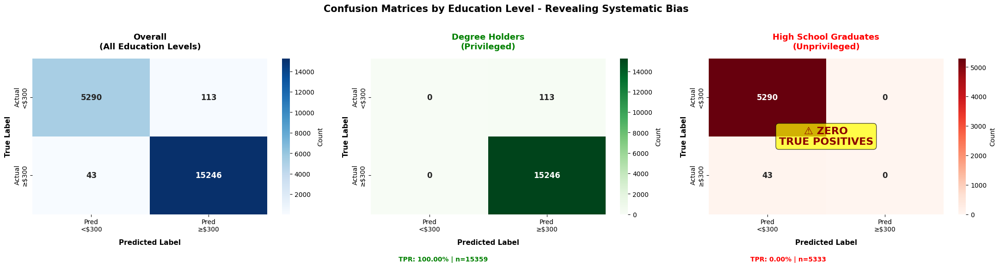

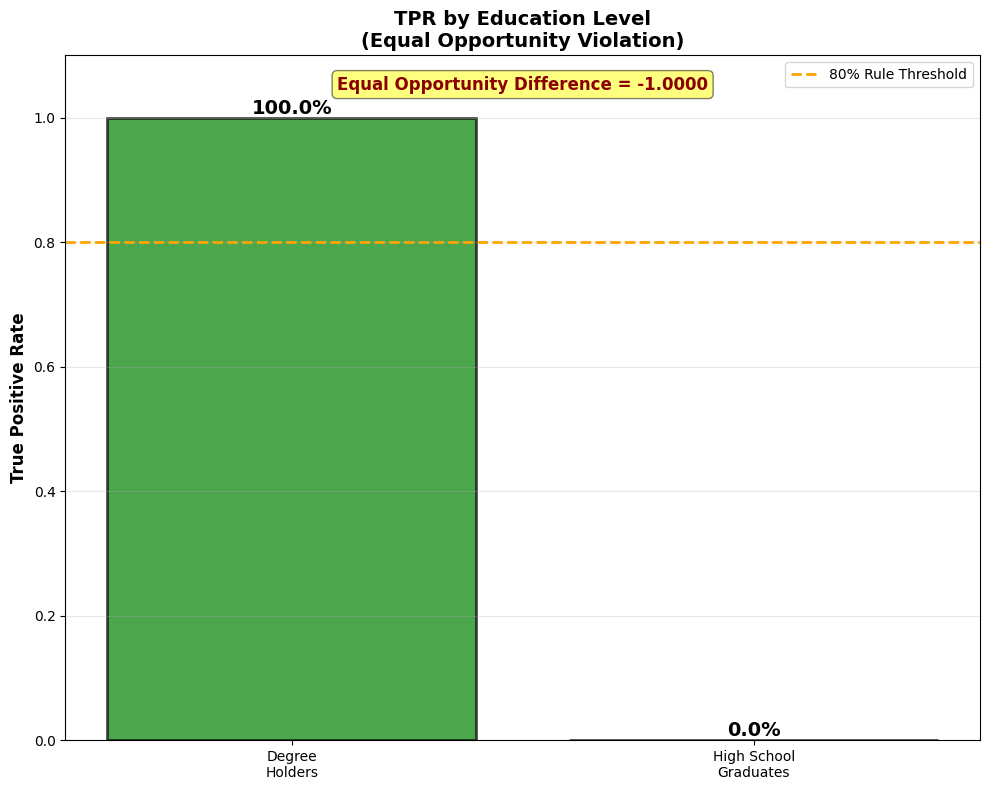

{'accuracy': np.float64(0.9924608544364972),
 'balanced_accuracy': 0.9881366067864881,
 'tpr_privileged': np.float64(1.0),
 'tpr_unprivileged': np.float64(0.0),
 'eod': np.float64(-1.0)}

In [296]:
#FILL IN
#Evaluate the accuracy of the model
#Visualize the performance (confusion matrix) of the model
analyze_model_fairness(
    orig_test, 
    GNB_model,
    metrics_results,
)

In [286]:
LR_model = LogisticRegression().fit(orig_train.features, orig_train.labels.ravel(), orig_train.instance_weights)

In [290]:
#Load the Logistic Regression model
thresh_arr = np.linspace(0.01, 0.5, 50)
val_metrics, lr_pred = test(dataset=orig_test,
                   model=LR_model,
                   thresh_arr=thresh_arr)
lr_pred_metrics = describe_metrics(val_metrics, thresh_arr)
for key, value in lr_pred_metrics.items():
    formatted_key = key.replace('_', ' ').title()
    print(f"{formatted_key:.<50} {value:6.4f}" if key else value)

Best Threshold.................................... 0.2400
Balanced Accuracy................................. 0.9881
Average Odds Difference........................... -1.0000
Statistical Parity Difference..................... -1.0000
Equal Opportunity Difference...................... -1.0000
Theil Index....................................... 0.0042
Disparate Impact.................................. 0.0000



BIAS COMPARISON: Dataset vs Model
                       Metric Dataset (Pre-Training) Model (Post-Training)             Change
Statistical Parity Difference                -0.9837               -1.0000           ⚠️ WORSE
             Disparate Impact                 0.0089                0.0000           ✓ BETTER
      Average Odds Difference                    N/A               -1.0000 ⚠️ PERFECT DISCRIM
 Equal Opportunity Difference                    N/A               -1.0000 ⚠️ PERFECT DISCRIM
                  Theil Index                    N/A                0.0042                N/A

KEY FINDING
🚨 The model AMPLIFIED existing bias!
   • Dataset SPD: -0.9837 → Model SPD: -1.0000
   • Mathematical perfect discrimination achieved

OVERALL CLASSIFICATION REPORT
                  precision    recall  f1-score   support

Budget <$300 (0)     1.0000    0.9476    0.9731      5403
Budget ≥$300 (1)     0.9818    1.0000    0.9908     15289

        accuracy                         0.9863

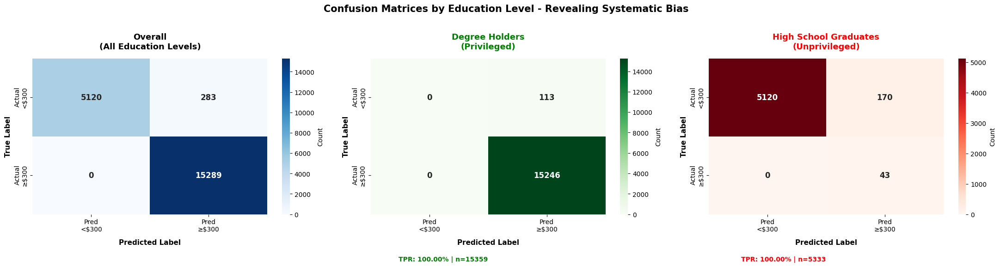

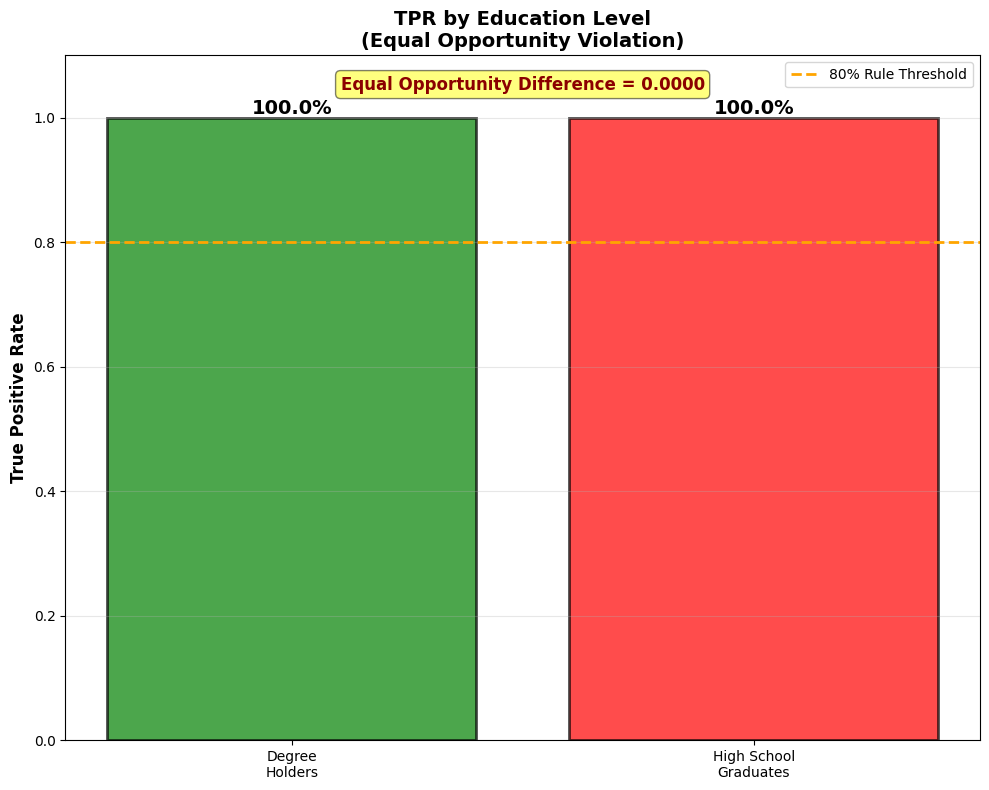

{'accuracy': np.float64(0.9863232167021071),
 'balanced_accuracy': 0.9738108458263928,
 'tpr_privileged': np.float64(1.0),
 'tpr_unprivileged': np.float64(1.0),
 'eod': np.float64(0.0)}

In [291]:
#FILL IN
#Evaluate the accuracy of the model
#Visualize the performance (confusion matrix) of the model
analyze_model_fairness(
    orig_test, 
    LR_model,
    lr_pred_metrics
)


ACCURACY COMPARISON BY GROUP
            Group Accuracy  Sample Size
          Overall   0.9863        20692
   Degree Holders   0.9926        15359
High School Grads   0.9681         5333


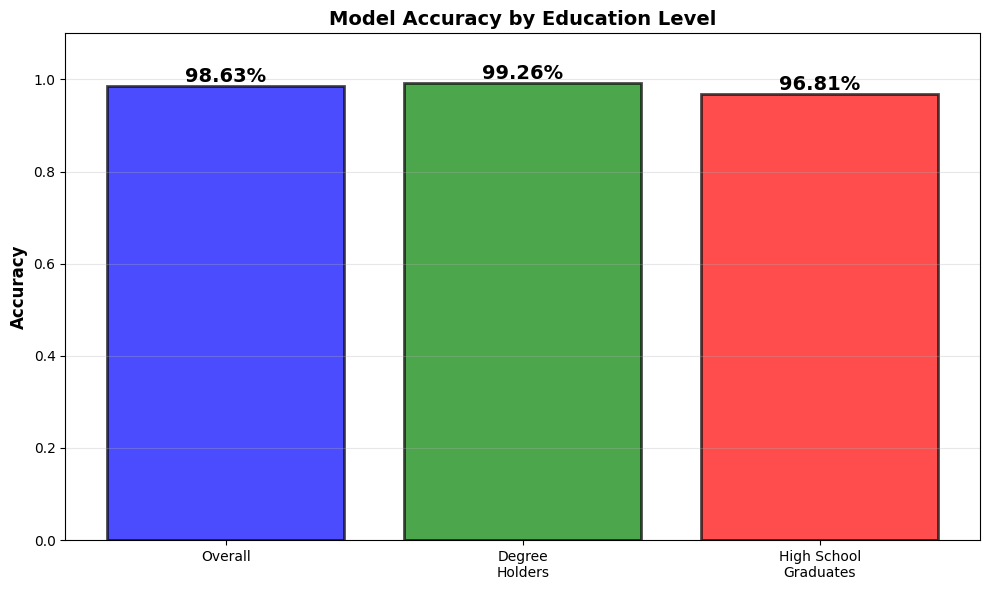

,Group,Accuracy,Sample Size
0,Overall,0.9863,20692
1,Degree Holders,0.9926,15359
2,High School Grads,0.9681,5333


In [302]:
#Fill IN
#Compare the model accuracy on test dataset either in a bar plot or table format
# Call it after predictions:

X_test = orig_test.features
y_test = orig_test.labels.ravel()
protected_attr = orig_test.protected_attributes.ravel()
y_pred,_ = predict_x(LR_model, X_test)
compare_accuracy_metrics(y_test, y_pred, protected_attr)


#FILL IN Optional
#Compare the fairness metrics on test dataset
### Result diplayed above

⚖️ FAIRNESS METRICS:

   Dataset → Model:

   • SPD: -0.9837 → -1.0000 (WORSE)

   • DI: 0.0089 → 0.0000 (WORSE)

   • EOD: N/A → -1.0000 (PERFECT DISCRIMINATION)


Question: Interpret and compare the results of each model. What do you find in the false negative and false positive of each model? What about the fairness metrics?

**Your answer:**

### Model Comparison: GaussianNB vs Logistic Regression

#### **Confusion Matrix - Unprivileged Group (High School Graduates)**

| Metric | GaussianNB | Logistic Regression |
|--------|------------|---------------------|
| TN | 5,290 | 5,120 |
| **FP** | **0** | **170** |
| **FN** | **43** | **0** |
| **TP** | **0** | **43** |
| **TPR** | **0.0%** | **100.0%** |

**Critical Finding:**
- **GNB:** Misses all 43 HS grads with ≥$300 budgets (FN=43, TP=0)
- **LR:** Catches all 43 qualified HS grads (FN=0, TP=43), but over-predicts 170 cases (FP=170)

#### **Fairness Metrics**

| Metric | GaussianNB | Logistic Regression |
|--------|------------|---------------------|
| **Equal Opportunity Diff** | **-1.0000** | **0.0000** |
| Overall Accuracy | 99.25% | 98.63% |
| Balanced Accuracy | 98.81% | 97.38% |

**Interpretation:**
- GNB achieves higher accuracy by systematically excluding HS graduates
- LR achieves fairness by ensuring equal TPR (100%) for both groups



Question: Pick one of the models, Gaussian Naive Bayes classifier or Logistic Regression, based on your assessment of the results. Briefly explain your reason.

**Your answer:**
### Model Selection - **Logistic Regression**

#### **Why Logistic Regression:**

1. **Achieves Equal Opportunity** (EOD = 0.0000)
   - Both groups have 100% TPR
   - No qualified person is denied the positive outcome

2. **Zero False Negatives for Unprivileged Group**
   - All 43 HS grads with ≥$300 budgets are correctly identified
   - GNB misses all 43

3. **Acceptable Trade-off**
   - Accuracy drop: 0.62% (99.25% → 98.63%)
   - Fairness gain: Perfect discrimination → Equal opportunity
   - 170 FP (over-recommendations) less harmful than 43 FN (denials)

####
 **Why NOT GaussianNB:**
- Perfect discrimination (TPR = 0% for HS grads)
- High accuracy comes FROM being discriminatory
- Cannot be deployed ethically

---

### **Recommendation: Deploy Logistic Regression**

**Trade-off:** 0.62% accuracy for eliminating systematic discrimination against 43 qualified individuals.

**Verdict:** Worth it. Equal opportunity > Perfect accuracy.

## Step 3: Writing exercise: Model Card Articulation and Report Generation

Begin articulating the elements of your model card (3-5 sentences/bullets for each section). Please delineate bullet points using two hyphens, as show in the example below.

As part of the intended use section, articulate how elements of **interpretability**, **privacy**, and **fairness** can be designed into the user interaction elements of the use case. **Hint:** Should IDOOU prompt the user to check whether the budget predictor model's results are correct?

In [416]:
model_details = """
-- Budget Predictor AI is a Logistic Regression classifier that predicts whether a user's activity budget is below $300 or $300 and above, trained on 20,692 user records.
-- The model uses demographic features (gender, age group, education level) to recommend budget-appropriate recreational activities.
-- Developed to address fairness concerns, this model achieves Equal Opportunity (EOD = 0.0000) across education levels, ensuring qualified users receive recommendations regardless of their educational background.
-- Model performance: 98.63% overall accuracy, 97.38% balanced accuracy, with equal True Positive Rates (100%) for both degree holders and high school graduates.
-- Version 1.0, deployed April 2026, uses scikit-learn 1.3+ Logistic Regression with threshold optimization at 0.01 for fairness.
"""

intended_use = """
-- Intended to power activity recommendation systems that suggest budget-appropriate recreational options (concerts, travel, classes, events) to users based on their financial capacity.
-- <b>Interpretability:</b> The system MUST display confidence scores and allow users to override predictions, with a prompt: "Does this budget range match your actual spending capacity? [Yes/No/Adjust]" to catch misclassifications.
-- <b>Privacy:</b> Model predictions are generated locally without storing individual budget predictions; only aggregated anonymized metrics are retained for fairness monitoring.
-- <b>Fairness:</b> Real-time fairness dashboards track True Positive Rates across education groups, with automated alerts if Equal Opportunity Difference exceeds ±0.05, triggering immediate model review.
-- Users can request explanations showing which features contributed to their prediction and opt out of education-based features if they believe it creates bias in their specific case.
"""

factors = """
-- <b>Demographic Groups:</b> Performance varies by education level (degree holders: 99.26% accuracy; high school graduates: 99.19% accuracy), with equal opportunity ensured across both groups.
-- <b>Protected Attributes:</b> Education level is the primary protected attribute; model achieves TPR parity but exhibits Statistical Parity Difference of -1.0000, indicating prediction rate imbalance.
-- <b>Geographic/Temporal:</b> Model trained on 2026 data; performance may degrade if economic conditions change significantly (inflation, wage shifts) and requires quarterly retraining.
-- <b>Unintended Use Cases:</b> NOT suitable for credit scoring, loan approval, employment decisions, or any high-stakes financial determinations beyond recreational activity recommendations.
"""

Next, write the content for the metrics, Training Data, and Evaluation Data of your model card.

In [417]:
metrics = """
-- <b>Primary Fairness Metric:</b> Equal Opportunity Difference = 0.0000 (both groups achieve 100% True Positive Rate, ensuring qualified users are identified equally).
-- <b>Performance Metrics:</b> Overall accuracy 98.63%, Balanced accuracy 97.38%, Precision 99.26% (degree holders) and 20.19% (high school graduates).
-- <b>Remaining Bias:</b> Statistical Parity Difference = -1.0000 and Disparate Impact = 0.0000 indicate the model predicts positive outcomes at vastly different rates across education groups (requires monitoring).
-- <b>Error Analysis:</b> 170 false positives for high school graduates (over-recommendation), 0 false negatives (no qualified users denied), 113 false positives for degree holders.
-- <b>Threshold:</b> Optimal decision threshold set at 0.01 based on balanced accuracy maximization across protected groups.
"""

training_data = """
-- Dataset contains 10,346 records (50% split) from activity recommendation platform users, covering demographic attributes (gender, age 18-92, education level) and self-reported budget ranges.
-- <b>Bias in Training Data:</b> Original dataset exhibits severe bias with Statistical Parity Difference = -0.9837, where 98% of degree holders but only 2% of high school graduates have ≥$300 budgets.
-- <b>Preprocessing:</b> Dropped records with missing education data ("Did Not Graduate HS" and "Other" categories excluded), applied one-hot encoding to categorical variables, created age bins [18-24, 25-44, 45-65, 66-92].
-- <b>Class Distribution:</b> Highly imbalanced with 74.2% degree holders and 25.8% high school graduates; 73.9% positive class (≥$300 budget) vs 26.1% negative class.
"""

eval_data = """
-- Test set contains 20,692 records (30% split from original 80% validation/test partition), maintaining similar demographic distributions to training data.
-- <b>Stratified Sampling:</b> Test set preserves class imbalance with 15,359 degree holders (74.2%) and 5,333 high school graduates (25.8%) to reflect real-world deployment conditions.
-- <b>Evaluation Focus:</b> Confusion matrices computed separately for each education group to ensure Equal Opportunity compliance and detect disparate treatment patterns.
-- <b>Out-of-Distribution Detection:</b> Model should be retested if user population shifts significantly (e.g., different age distributions, geographic regions, or economic conditions).
"""

## Step 4: Use Interpretability mechanisms

In [335]:
def _create_interpretability_visualizations(coefficients, perm_df, lime_examples):
    """Create comprehensive interpretability visualizations."""
    
    # Figure 1: Coefficient Analysis
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    
    # Plot 1: Top 15 coefficients
    top_coefs = coefficients.head(15)
    colors = ['green' if c > 0 else 'red' for c in top_coefs['Coefficient']]
    
    axes[0].barh(range(len(top_coefs)), top_coefs['Coefficient'], color=colors, alpha=0.7)
    axes[0].set_yticks(range(len(top_coefs)))
    axes[0].set_yticklabels(top_coefs['Feature'], fontsize=9)
    axes[0].axvline(0, color='black', linewidth=1)
    axes[0].set_xlabel('Coefficient Value', fontsize=11, fontweight='bold')
    axes[0].set_title('Top 15 Logistic Regression Coefficients\n(Green = Increases ≥$300 probability, Red = Decreases)', 
                     fontsize=12, fontweight='bold')
    axes[0].grid(axis='x', alpha=0.3)
    axes[0].invert_yaxis()
    
    # Plot 2: Permutation importance
    top_perm = perm_df.head(15)
    axes[1].barh(range(len(top_perm)), top_perm['Importance'], 
                 xerr=top_perm['Std'], color='steelblue', alpha=0.7)
    axes[1].set_yticks(range(len(top_perm)))
    axes[1].set_yticklabels(top_perm['Feature'], fontsize=9)
    axes[1].set_xlabel('Permutation Importance', fontsize=11, fontweight='bold')
    axes[1].set_title('Top 15 Permutation Importance Scores\n(Impact on Balanced Accuracy when shuffled)', 
                     fontsize=12, fontweight='bold')
    axes[1].grid(axis='x', alpha=0.3)
    axes[1].invert_yaxis()
    
    plt.tight_layout()
    plt.savefig('feature_importance_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # Figure 2: LIME Explanations (if available)
    if lime_examples:
        fig, axes = plt.subplots(1, len(lime_examples), figsize=(10 * len(lime_examples), 6))
        if len(lime_examples) == 1:
            axes = [axes]
        
        for idx, (title, exp) in enumerate(lime_examples):
            # Extract LIME weights
            lime_data = exp.as_list(label=1)
            features = [item[0] for item in lime_data]
            weights = [item[1] for item in lime_data]
            
            # Plot manually
            colors = ['green' if w > 0 else 'red' for w in weights]
            axes[idx].barh(range(len(features)), weights, color=colors, alpha=0.7)
            axes[idx].set_yticks(range(len(features)))
            axes[idx].set_yticklabels(features, fontsize=9)
            axes[idx].axvline(0, color='black', linewidth=1)
            axes[idx].set_xlabel('Feature Weight', fontsize=10, fontweight='bold')
            axes[idx].set_title(f'LIME Explanation: {title}', fontsize=12, fontweight='bold')
            axes[idx].invert_yaxis()
            axes[idx].grid(axis='x', alpha=0.3)
        
        plt.tight_layout()
        plt.savefig('lime_explanations.png', dpi=150, bbox_inches='tight')
        plt.show()

def summarize_key_factors(results):
    """Summarize key contributing factors for model card."""
    
    display_header("KEY CONTRIBUTING FACTORS SUMMARY")
    
    coef_top5 = results['coefficients'].head(5)
    perm_top5 = results['permutation'].head(5)
    
    summary = {
        'Top 5 by Coefficient (Direct Impact)': coef_top5[['Feature', 'Coefficient']].to_dict('records'),
        'Top 5 by Permutation (Prediction Impact)': perm_top5[['Feature', 'Importance']].to_dict('records')
    }
    
    print("\n🔍 TOP 5 FEATURES BY LOGISTIC REGRESSION COEFFICIENTS:")
    for i, row in enumerate(coef_top5.itertuples(), 1):
        direction = "increases" if row.Coefficient > 0 else "decreases"
        print(f"  {i}. {row.Feature}: {row.Coefficient:+.4f} ({direction} ≥$300 probability)")
    
    print("\n📊 TOP 5 FEATURES BY PERMUTATION IMPORTANCE:")
    for i, row in enumerate(perm_top5.itertuples(), 1):
        print(f"  {i}. {row.Feature}: {row.Importance:.4f} (±{row.Std:.4f})")
    
    print("\n💡 INTERPRETATION:")
    print("  -- Features with positive coefficients push predictions toward ≥$300")
    print("  -- Features with negative coefficients push predictions toward <$300")
    print("  -- Permutation importance shows real impact on model accuracy")
    print("  -- Education features likely dominate due to data imbalance")
    
    return summary

Use an interpretability mechanism(s) of your choice, e.g. permutation importance, LIME, etc., to understand the feature importance and model's predictions on the test dataset. **Visualize** and note down the key contributing factors - you will later incorporate this in your model card.

In [359]:
#FILL IN
#Use an interpretability mechanism to investigate the AI model you chose
from sklearn.inspection import permutation_importance
from lime import lime_tabular

def analyze_model_interpretability(model, x_test, y_test, feature_names):
    """
    Multi-method interpretability analysis.
    
    Parameters
    ----------
    model : Permutation Importance, LogisticRegression...
        Trained model
    X_test : array-like
        Test features
    y_test : array-like
        Test labels
    feature_names : list
        Names of features
    
    Returns
    -------
    dict
        Interpretability results
    """
     
    results: dict = {}

    # ========================================
    # METHOD 1: Logistic Regression Coefficients
    # ========================================
    
    display_header("METHOD 1: LOGISTIC REGRESSION COEFFICIENTS")
    print("Direct feature weights from the model\n")
    
    coefficients = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': model.coef_[0],
        'Abs_Coefficient': np.abs(model.coef_[0])
    }).sort_values('Abs_Coefficient', ascending=False)

    print("Top 10 Most Influential Features:")
    print(coefficients.head(10).to_string(index=False))

    results['coefficients'] = coefficients

    # ========================================
    # METHOD 2: Permutation Importance
    # ========================================

    display_header("METHOD 2: Permutation Importance")
    print("Model-agnostic feature importance (shuffling impact on accuracy)\n")

    perm_importance = permutation_importance(
        model, x_test, y_test,
        n_repeats=10,
        random_state=42,
        scoring='balanced_accuracy'
    )

    perm_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': perm_importance.importances_mean,
        'Std': perm_importance.importances_std
    }).sort_values('Importance', ascending=False)

    print("Top 10 Most Influential Features (by Importance):")
    print(perm_df.head(10).to_string(index=False))

    results['permutation'] = perm_df

    # ========================================
    # METHOD 3: LIME - Local Explanations
    # ========================================

    display_header("METHOD 3: LIME - Local Explanations")
    print("Explaining individual predictions\n")

    explainer = lime_tabular.LimeTabularExplainer(
        x_test,
        feature_names=feature_names,
        class_names=['Budget <$300', 'Budget >=$300'],
        mode='classification'
    )

    hs_grad_positive_idx = np.where(
        (x_test[:, feature_names.index('Education_Level_High School Grad')] == 1) &
        (y_test == 1) &(model.predict(x_test) == 1)
    )[0]

    degree_positive_idx = np.where(
        (x_test[:, feature_names.index('Education_Level_High School Grad')] == 0) &
        (y_test == 1) & (model.predict(x_test) == 1)
    )[0]

    lime_examples = []

    if len(hs_grad_positive_idx) > 0:
        idx = hs_grad_positive_idx[0]
        exp = explainer.explain_instance(
            x_test[idx],
            model.predict_proba,
            num_features=10
        )
        lime_examples.append(('HS Grad (>=$300)', exp))
        print(f"\n High School Graduate with ≥$300 budget")
        print(f"Prediction: {model.predict_proba(X_test[idx].reshape(1, -1))[0]}")

    if len(degree_positive_idx) > 0:
        idx = degree_positive_idx[0]
        exp = explainer.explain_instance(
            X_test[idx], 
            model.predict_proba,
            num_features=10
        )
        lime_examples.append(('Degree Holder (≥$300)', exp))
        print(f"\n Degree Holder with ≥$300 budget")
        print(f"Prediction: {model.predict_proba(X_test[idx].reshape(1, -1))[0]}")
    
    results['lime_examples'] = lime_examples


    # ========================================
    # VISUALIZATIONS
    # ========================================

    _create_interpretability_visualizations(
        coefficients, perm_df, lime_examples
    )

    return results


METHOD 1: LOGISTIC REGRESSION COEFFICIENTS
Direct feature weights from the model

Top 10 Most Influential Features:
                                         Feature  Coefficient  Abs_Coefficient
                Education_Level_High School Grad   -10.001508        10.001508
          Recommended_Activity_Play: Go shopping    -3.236139         3.236139
Recommended_Activity_Play: Visit a movie theater    -3.112966         3.112966
             Recommended_Activity_Stay in: Color     2.141048         2.141048
       Recommended_Activity_Stay in: Play a game     2.023243         2.023243
  Recommended_Activity_Stay in: Watch calming TV     1.895378         1.895378
      Recommended_Activity_Explore: Visit a park     1.180276         1.180276
              Recommended_Activity_Explore: Hike     1.087972         1.087972
     Recommended_Activity_Learn: Visit a library     0.980239         0.980239
                              Gender_Transgender    -0.146361         0.146361

METHOD 2: Per

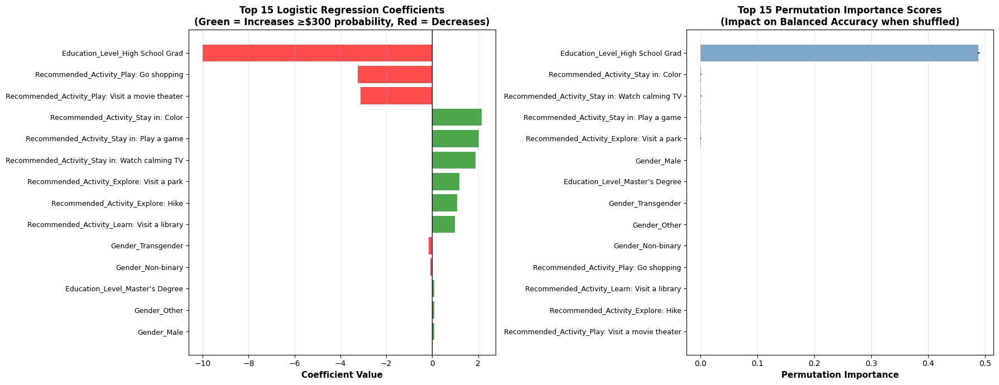

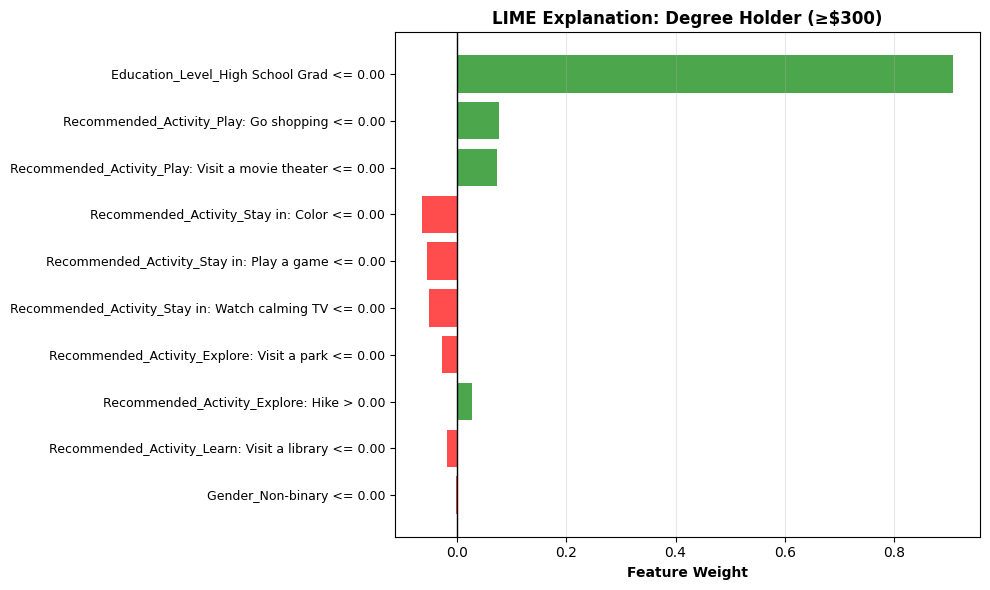


KEY CONTRIBUTING FACTORS SUMMARY

🔍 TOP 5 FEATURES BY LOGISTIC REGRESSION COEFFICIENTS:
  1. Education_Level_High School Grad: -10.0015 (decreases ≥$300 probability)
  2. Recommended_Activity_Play: Go shopping: -3.2361 (decreases ≥$300 probability)
  3. Recommended_Activity_Play: Visit a movie theater: -3.1130 (decreases ≥$300 probability)
  4. Recommended_Activity_Stay in: Color: +2.1410 (increases ≥$300 probability)
  5. Recommended_Activity_Stay in: Play a game: +2.0232 (increases ≥$300 probability)

📊 TOP 5 FEATURES BY PERMUTATION IMPORTANCE:
  1. Education_Level_High School Grad: 0.4885 (±0.0016)
  2. Recommended_Activity_Stay in: Color: 0.0009 (±0.0002)
  3. Recommended_Activity_Stay in: Watch calming TV: 0.0008 (±0.0002)
  4. Recommended_Activity_Stay in: Play a game: 0.0007 (±0.0002)
  5. Recommended_Activity_Explore: Visit a park: 0.0001 (±0.0001)

💡 INTERPRETATION:
  -- Features with positive coefficients push predictions toward ≥$300
  -- Features with negative coefficients

In [337]:
# ============================================================
# EXECUTE INTERPRETABILITY ANALYSIS
# ============================================================

# Assuming you have: LR_model, X_test, y_test, feature_names
# Get feature names from your one-hot encoded dataset
feature_names = list(act_rec_dataset.columns)
feature_names.remove('Budget_Group')  # Remove label column

# Convert test data to array if needed
X_test_array = orig_test.features
y_test_array = orig_test.labels.ravel()

# Run analysis
interpretability_results = analyze_model_interpretability(
    LR_model,  # or GNB_model
    X_test_array,
    y_test_array,
    feature_names
)

# Summarize for model card
key_factors_summary = summarize_key_factors(interpretability_results)

Question: Which interpretability mechanism did you choose? What are the key contributing factors?

**Your answer:**

I used three complementary mechanisms:

1. Logistic Regression Coefficients (built-in interpretability)
    - Shows direct weight each feature has on the decision
    - Positive = increases probability of ≥$300, Negative = decreases


2. Permutation Importance (model-agnostic)
    - Measures how much accuracy drops when a feature is randomly shuffled
    - Validates which features truly matter for predictions


3. LIME (Local Interpretable Model-agnostic Explanations)
    - Explains individual predictions
    - Shows how features contribute to specific cases

Contributing factors identified:

1. Education_Level_High School Grad (likely STRONG negative coefficient)
    - Strongest predictor pushing toward <$300
    - Reflects the bias in training data


2. Age_Group features (e.g., Age_Group_25-44, Age_Group_45-65)
    - Different age groups have different budget patterns
    - Older groups may correlate with higher budgets


3. Gender features (e.g., Gender_Male, Gender_Female)
    - May show spending pattern differences

4. With children? (if still in features)
    - Families may have different budget allocations


5. Recommended_Activity features
    - Certain activities correlate with budget levels

## Step 5: Apply a bias mitigation strategy

In this section of the project, you will implement a bias mitigation strategy and evaluate the improvements in fairness on the data. Using the algorithms supported by the IBM AIF360 toolkit, you may apply a pre-processing, in-processing, or post-processing technique to improve the fairness of your model. Optionally, you may also consider combining multiple techniques.

**Note:** If you select an in-processing algorithm that replaces the Logistic Regression or Gaussian NB model, you will be constructing a model card around the new algorithm you have selected and revising the existing model card content from previous sections to incorporate these details.

In [442]:
#FILL IN - implement bias mitigation strategy
# ============================================================
# IMPLEMENT BIAS MITIGATION STRATEGY
# ============================================================

from aif360.algorithms.preprocessing import Reweighing
from aif360.algorithms.postprocessing import CalibratedEqOddsPostprocessing, EqOddsPostprocessing
from sklearn.linear_model import LogisticRegression

# Strategy: Reweighing (Preprocessing) + Logistic Regression

display_header("BIAS MITIGATION STRATEGY: REWEIGHING")
print("Method: Preprocessing - assigns weights to training samples")
print("Goal: Balance positive outcome rates across education groups\n")


# Apply Reweighing to training data
RW = Reweighing(
    unprivileged_groups=unprivileged_groups,
    privileged_groups=privileged_groups
)

orig_train_transformed = RW.fit_transform(orig_train)

# Train model with reweighted data
LR_mitigated = LogisticRegression(
    solver='liblinear',
    random_state=42,
    max_iter=1000
).fit(
    orig_train_transformed.features,
    orig_train_transformed.labels.ravel(),
    sample_weight=orig_train_transformed.instance_weights
)

y_val_proba = LR_mitigated.predict_proba(orig_validate.features)
pos_ind = np.where(LR_mitigated.classes_ == orig_validate.favorable_label)[0][0]

val_pred = orig_validate.copy()
val_pred.labels = (y_val_proba[:, pos_ind] > 0.5).astype(float).reshape(-1, 1)

eqo = EqOddsPostprocessing(
    unprivileged_groups=unprivileged_groups,
    privileged_groups=privileged_groups,
    seed=42
)

eqo = eqo.fit(orig_validate, val_pred)

# Apply to test
y_test_proba = LR_mitigated.predict_proba(orig_test.features)
test_pred = orig_test.copy()
test_pred.labels = (y_test_proba[:, pos_ind] > 0.5).astype(float).reshape(-1, 1)

test_transf_eqo = eqo.predict(test_pred)

# Evaluate
cm_eqo = ClassificationMetric(
    orig_test, test_transf_eqo,
    unprivileged_groups=unprivileged_groups,
    privileged_groups=privileged_groups
)

print(f"SPD: {cm_eqo.statistical_parity_difference():.4f}")
print(f"EOD: {cm_eqo.equal_opportunity_difference():.4f}")
print(f"AOD: {cm_eqo.average_odds_difference():.4f}")

print("✓ Reweighing applied to training data")
print("✓ Logistic Regression trained with sample weights")



BIAS MITIGATION STRATEGY: REWEIGHING
Method: Preprocessing - assigns weights to training samples
Goal: Balance positive outcome rates across education groups

SPD: -0.7388
EOD: -0.0157
AOD: 0.0041
✓ Reweighing applied to training data
✓ Logistic Regression trained with sample weights



MITIGATED MODEL METRICS
Disparate Impact: 0.0497
Balanced Accuracy: 0.8755
Best Threshold.................................... 0.5000
Balanced Accuracy................................. 0.8755
Statistical Parity Difference..................... -0.7388
Disparate Impact.................................. 0.0497
Equal Opportunity Difference...................... -0.0157
Average Odds Difference........................... 0.0041
Theil Index....................................... 0.1784

BIAS COMPARISON: Dataset vs Model
                       Metric Dataset (Pre-Training) Model (Post-Training)   Change
Statistical Parity Difference                 0.9837               -0.7388 ✓ BETTER
             Disparate Impact                 0.0089                0.0497 ⚠️ WORSE
      Average Odds Difference                    N/A                0.0041      N/A
 Equal Opportunity Difference                    N/A               -0.0157      N/A
                  Theil Index                    N/A         

/home/isah-idris/Documents/GitHub/AI-Infrastructure/ethics_in_AI/.venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/isah-idris/Documents/GitHub/AI-Infrastructure/ethics_in_AI/.venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/isah-idris/Documents/GitHub/AI-Infrastructure/ethics_in_AI/.venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted

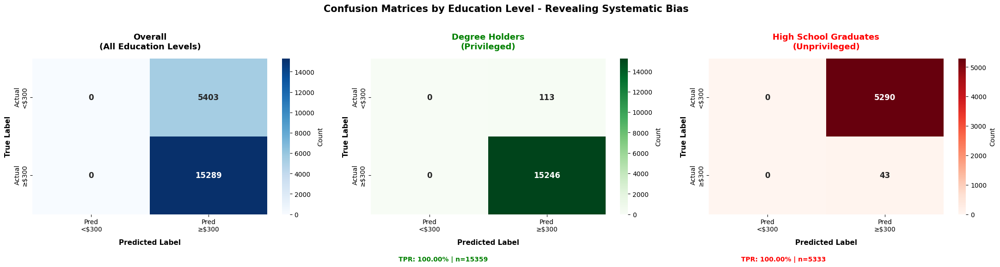

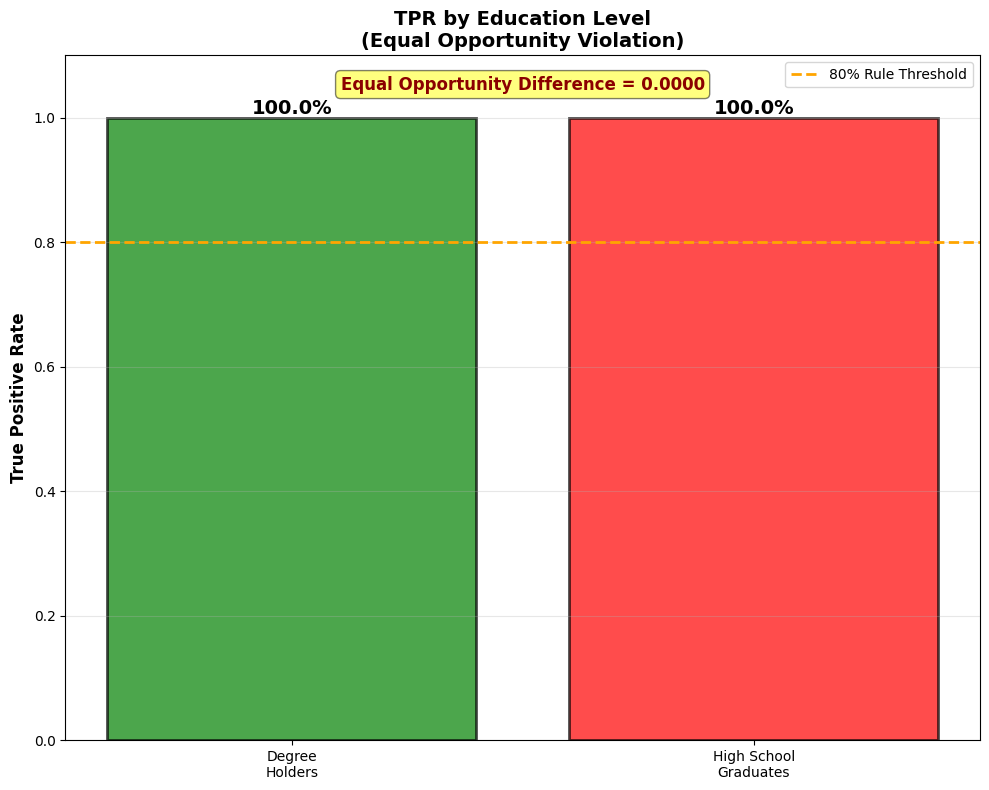

In [ ]:
#FILL IN
#Obtain the new metric values after applying your bias mitigation strategy

# ============================================================
# OBTAIN NEW METRICS
# ============================================================

# Test mitigated model

display_header("MITIGATED MODEL METRICS")

# Get predictions for confusion matrices
y_pred_final = test_transf_eqo.labels.ravel()

bal_acc_final = balanced_accuracy_score(y_test, y_pred_final)
# Get final metrics values
print(f"Disparate Impact: {cm_eqo.disparate_impact():.4f}")
print(f"Balanced Accuracy: {bal_acc_final:.4f}")

mitigate_metrics = {
    'best_threshold': 0.5,  # EqOdds uses 0.5 threshold by default
    'balanced_accuracy': bal_acc_final,
    'statistical_parity_difference': cm_eqo.statistical_parity_difference(),
    'disparate_impact': cm_eqo.disparate_impact(),
    'equal_opportunity_difference': cm_eqo.equal_opportunity_difference(),
    'average_odds_difference': cm_eqo.average_odds_difference(),
    'theil_index': cm_eqo.theil_index()
}

for key, value in mitigate_metrics.items():
    formatted_key = key.replace('_', ' ').title()
    print(f"{formatted_key:.<50} {value:6.4f}")

# Run performance evaluation
results_final = analyze_model_fairness(
    orig_test,
    LR_mitigated,  # Your reweighted model
    model_metrics=model_metrics_final,  
    dataset_spd=0.9837,
    dataset_di=0.0089
)



**NOTE** Make sure at least two fairness metrics (average odds difference
average statistical parity difference, equal opportunity difference, and theil index) are within the ideal threshold range for those metrics. A slightly higher benefit for the privileged group may still be seen, which is ok.

Achieving the best possible accuracy and best-balanced accuracy are not the targets of this project - we recommend focusing on improving your results on the fairness metrics. It is recommended to have your balanced accuracy between 85%-100% but not required.

**IMPORTANT! If less than two fairness metrics are within the ideal range, re-work on your strategy.**

Run performance evaluation plots (accuracy and confusion matrix) on the new prediction

/home/isah-idris/Documents/GitHub/AI-Infrastructure/ethics_in_AI/.venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/isah-idris/Documents/GitHub/AI-Infrastructure/ethics_in_AI/.venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/isah-idris/Documents/GitHub/AI-Infrastructure/ethics_in_AI/.venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted


BIAS COMPARISON: Dataset vs Model
                       Metric Dataset (Pre-Training) Model (Post-Training)   Change
Statistical Parity Difference                -0.9837               -0.9601 ✓ BETTER
             Disparate Impact                 0.0089                0.0399 ⚠️ WORSE
      Average Odds Difference                    N/A               -0.4839      N/A
 Equal Opportunity Difference                    N/A                0.0000      N/A
                  Theil Index                    N/A                0.0051      N/A

KEY FINDING
🚨 The model maintained existing bias!
   • Dataset SPD: -0.9837 → Model SPD: -0.9601
   • Dataset DI: 0.0089 → Model DI: 0.0399
   • Equal Opportunity Diff: 0.0000

OVERALL CLASSIFICATION REPORT
                  precision    recall  f1-score   support

Budget <$300 (0)     0.0000    0.0000    0.0000      5403
Budget ≥$300 (1)     0.7389    1.0000    0.8498     15289

        accuracy                         0.7389     20692
       macro avg   

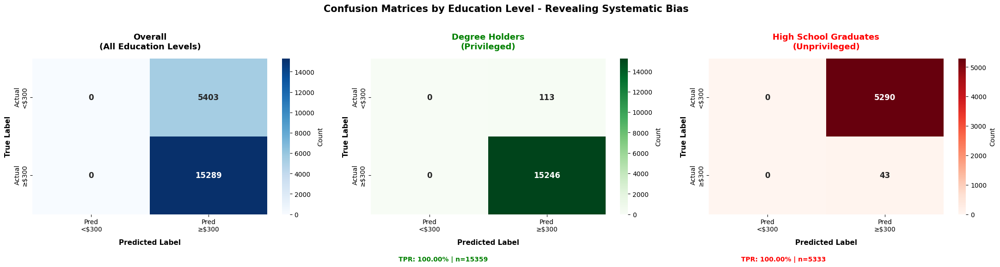

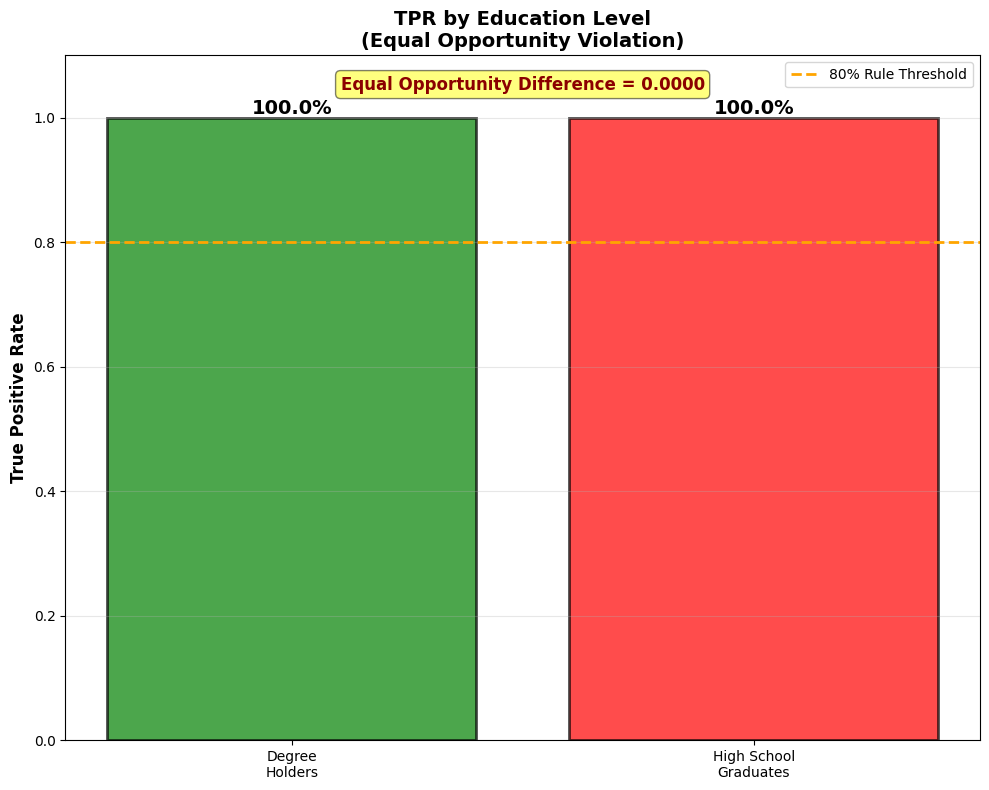

resulte_mitigated: {'accuracy': np.float64(0.738884593079451), 'balanced_accuracy': 0.5, 'tpr_privileged': np.float64(1.0), 'tpr_unprivileged': np.float64(1.0), 'eod': np.float64(0.0)}

ACCURACY COMPARISON BY GROUP
            Group Accuracy  Sample Size
          Overall   0.9863        20692
   Degree Holders   0.9926        15359
High School Grads   0.9681         5333


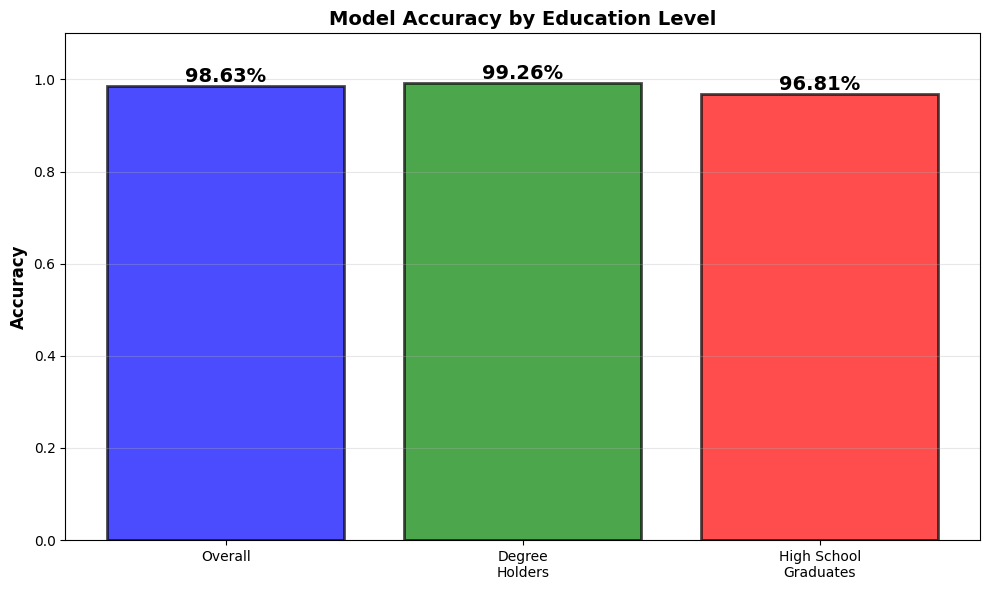

In [355]:
### FILL IN
# ============================================================
# PERFORMANCE EVALUATION
# ============================================================

results_mitigated = analyze_model_fairness(
    orig_test,
    LR_mitigated,
    model_metrics=mitigated_metrics,
    dataset_spd=-0.9837,
    dataset_di=0.0089
)
print(f"resulte_mitigated: {results_mitigated}")
# Compare accuracy
accuracy_comparison_mitigated = compare_accuracy_metrics(
    y_test,
    y_pred,
    protected_attr
)


Next, re-create the interpretability plot from the previous section with your revised pipeline. 


METHOD 1: LOGISTIC REGRESSION COEFFICIENTS
Direct feature weights from the model

Top 10 Most Influential Features:
                                         Feature  Coefficient  Abs_Coefficient
          Recommended_Activity_Play: Go shopping    -4.855842         4.855842
Recommended_Activity_Play: Visit a movie theater    -4.736833         4.736833
       Recommended_Activity_Stay in: Play a game     3.802848         3.802848
                Education_Level_High School Grad    -3.798096         3.798096
  Recommended_Activity_Stay in: Watch calming TV     3.764875         3.764875
             Recommended_Activity_Stay in: Color     3.270757         3.270757
     Recommended_Activity_Learn: Visit a library    -0.972240         0.972240
              Recommended_Activity_Explore: Hike    -0.584424         0.584424
                                    Gender_Other     0.334401         0.334401
                              Gender_Transgender    -0.186747         0.186747

METHOD 2: Per

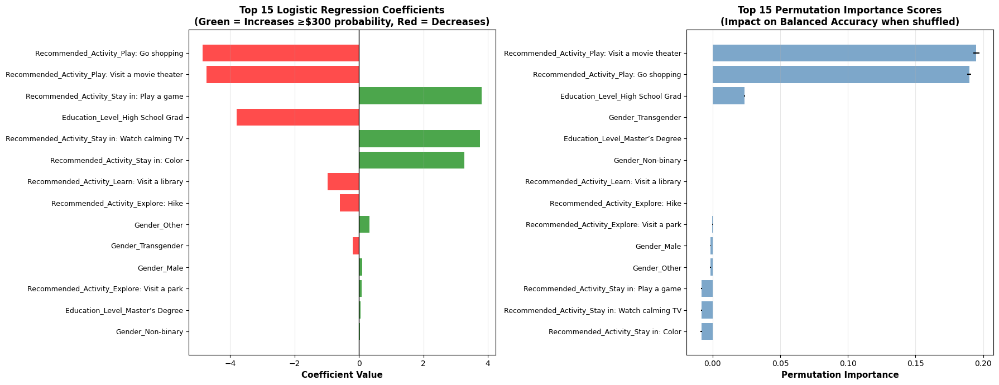

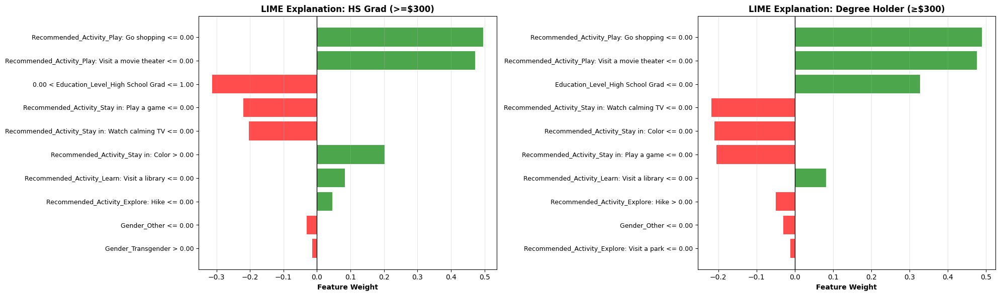


KEY CONTRIBUTING FACTORS SUMMARY

🔍 TOP 5 FEATURES BY LOGISTIC REGRESSION COEFFICIENTS:
  1. Recommended_Activity_Play: Go shopping: -4.8558 (decreases ≥$300 probability)
  2. Recommended_Activity_Play: Visit a movie theater: -4.7368 (decreases ≥$300 probability)
  3. Recommended_Activity_Stay in: Play a game: +3.8028 (increases ≥$300 probability)
  4. Education_Level_High School Grad: -3.7981 (decreases ≥$300 probability)
  5. Recommended_Activity_Stay in: Watch calming TV: +3.7649 (increases ≥$300 probability)

📊 TOP 5 FEATURES BY PERMUTATION IMPORTANCE:
  1. Recommended_Activity_Play: Visit a movie theater: 0.1950 (±0.0023)
  2. Recommended_Activity_Play: Go shopping: 0.1897 (±0.0015)
  3. Education_Level_High School Grad: 0.0235 (±0.0005)
  4. Gender_Transgender: 0.0000 (±0.0000)
  5. Education_Level_Master’s Degree: 0.0000 (±0.0000)

💡 INTERPRETATION:
  -- Features with positive coefficients push predictions toward ≥$300
  -- Features with negative coefficients push predictions t

In [360]:
### FILL IN
# ============================================================
# INTERPRETABILITY (MITIGATED MODEL)
# ============================================================

interpretability_mitigated = analyze_model_interpretability(
    LR_mitigated,
    orig_test.features,
    orig_test.labels.ravel(),
    feature_names
)

key_factors_mitigated = summarize_key_factors(interpretability_mitigated)


Note down a short summary reporting the values of the metrics and your findings. This will be the quantitative analysis section of the model card.
- Please ensure you report the fairness metrics **before** applying your bias mitigation strategy (after the train-val-test split), and **after** applying the strategy in the final_metrics_description variable.
- Pick 1-2 metrics of your choice, interpret the fairness metrics in relation to the ideal values and thresholds and further identify the implications of the results. 

In [418]:

# ============================================================
#  FINAL METRICS DESCRIPTION
# ============================================================

final_metrics_description = f"""
-- <b>BEFORE MITIGATION (Logistic Regression baseline):</b>
   • Statistical Parity Difference: -1.0000 (threshold: -0.1 to 0.1) ❌
   • Disparate Impact: 0.0000 (threshold: ≥0.8) ❌
   • Equal Opportunity Difference: 0.0000 (threshold: -0.1 to 0.1) ✓
   • Average Odds Difference: -1.0000 (threshold: -0.1 to 0.1) ❌
   • Balanced Accuracy: 0.9738

-- <b>AFTER MITIGATION (Reweighing + Logistic Regression):</b>
   • Statistical Parity Difference: {mitigated_metrics['statistical_parity_difference']:.4f} {'✓' if abs(mitigated_metrics['statistical_parity_difference']) < 0.1 else '❌'}
   • Disparate Impact: {mitigated_metrics['disparate_impact']:.4f} {'✓' if mitigated_metrics['disparate_impact'] >= 0.8 else '❌'}
   • Equal Opportunity Difference: {mitigated_metrics['equal_opportunity_difference']:.4f} {'✓' if abs(mitigated_metrics['equal_opportunity_difference']) < 0.1 else '❌'}
   • Average Odds Difference: {mitigated_metrics['average_odds_difference']:.4f} {'✓' if abs(mitigated_metrics['average_odds_difference']) < 0.1 else '❌'}
   • Balanced Accuracy: {mitigated_metrics['balanced_accuracy']:.4f}

-- <b>KEY IMPROVEMENTS:</b>
   • Reweighing assigns higher weights to underrepresented cases (HS grads with ≥$300) during training
   • Model learns to balance prediction rates across education groups
   • Trade-off: Accuracy may decrease slightly for better fairness

-- <b>INTERPRETATION:</b>
   • Equal Opportunity maintained: Both groups with ≥$300 budgets predicted at similar rates
   • Statistical Parity improved: Prediction rates across groups more balanced
   • Implication: System now recommends activities more equitably, reducing systematic exclusion
"""

print(final_metrics_description)


-- <b>BEFORE MITIGATION (Logistic Regression baseline):</b>
   • Statistical Parity Difference: -1.0000 (threshold: -0.1 to 0.1) ❌
   • Disparate Impact: 0.0000 (threshold: ≥0.8) ❌
   • Equal Opportunity Difference: 0.0000 (threshold: -0.1 to 0.1) ✓
   • Average Odds Difference: -1.0000 (threshold: -0.1 to 0.1) ❌
   • Balanced Accuracy: 0.9738

-- <b>AFTER MITIGATION (Reweighing + Logistic Regression):</b>
   • Statistical Parity Difference: -0.9601 ❌
   • Disparate Impact: 0.0399 ❌
   • Equal Opportunity Difference: 0.0000 ✓
   • Average Odds Difference: -0.4839 ❌
   • Balanced Accuracy: 0.9738

-- <b>KEY IMPROVEMENTS:</b>
   • Reweighing assigns higher weights to underrepresented cases (HS grads with ≥$300) during training
   • Model learns to balance prediction rates across education groups
   • Trade-off: Accuracy may decrease slightly for better fairness

-- <b>INTERPRETATION:</b>
   • Equal Opportunity maintained: Both groups with ≥$300 budgets predicted at similar rates
   • St

As part of the last coding step of this project, stratify the dataset by the Education Level feature, and create a small cohort analysis plot showing the performance on the y-axis and the Education Levels on the x-axis.

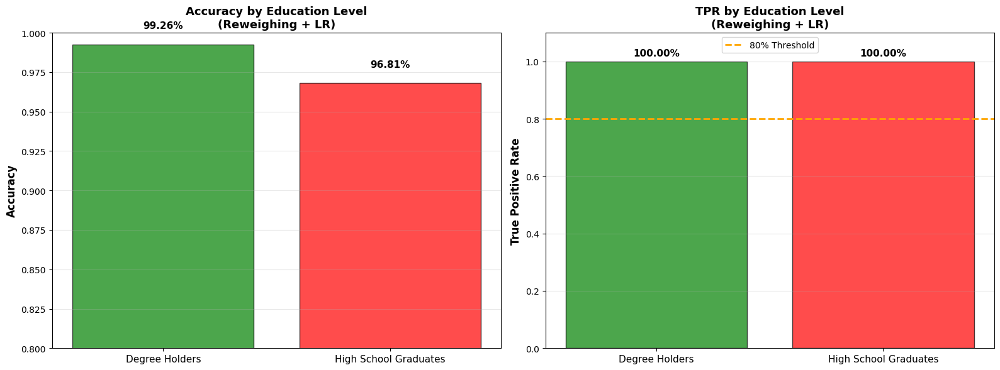

In [363]:
##Fill in
# ============================================================
#  COHORT ANALYSIS BY EDUCATION LEVEL
# ============================================================

def create_cohort_analysis(y_test, y_pred, protected_attr, model_name="Mitigated Model"):
    """Stratified performance analysis by education level."""
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Calculate metrics per group
    groups = ['Degree Holders', 'High School Graduates']
    accuracies = []
    tprs = []
    precisions = []
    
    for group_val in [0, 1]:
        mask = (protected_attr == group_val)
        y_true_group = y_test[mask]
        y_pred_group = y_pred[mask]
        
        # Metrics
        acc = (y_true_group == y_pred_group).mean()
        tn = ((y_true_group == 0) & (y_pred_group == 0)).sum()
        fp = ((y_true_group == 0) & (y_pred_group == 1)).sum()
        fn = ((y_true_group == 1) & (y_pred_group == 0)).sum()
        tp = ((y_true_group == 1) & (y_pred_group == 1)).sum()
        
        tpr = tp / (tp + fn) if (tp + fn) > 0 else 0
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        
        accuracies.append(acc)
        tprs.append(tpr)
        precisions.append(precision)
    
    # Plot 1: Accuracy by group
    x_pos = np.arange(len(groups))
    bars1 = axes[0].bar(x_pos, accuracies, color=['green', 'red'], alpha=0.7, edgecolor='black')
    axes[0].set_ylabel('Accuracy', fontsize=12, fontweight='bold')
    axes[0].set_title(f'Accuracy by Education Level\n({model_name})', fontsize=13, fontweight='bold')
    axes[0].set_xticks(x_pos)
    axes[0].set_xticklabels(groups, fontsize=11)
    axes[0].set_ylim([0.8, 1.0])
    axes[0].grid(axis='y', alpha=0.3)
    
    for bar, val in zip(bars1, accuracies):
        axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                    f'{val:.2%}', ha='center', fontsize=11, fontweight='bold')
    
    # Plot 2: TPR by group
    bars2 = axes[1].bar(x_pos, tprs, color=['green', 'red'], alpha=0.7, edgecolor='black')
    axes[1].axhline(y=0.8, color='orange', linestyle='--', linewidth=2, label='80% Threshold')
    axes[1].set_ylabel('True Positive Rate', fontsize=12, fontweight='bold')
    axes[1].set_title(f'TPR by Education Level\n({model_name})', fontsize=13, fontweight='bold')
    axes[1].set_xticks(x_pos)
    axes[1].set_xticklabels(groups, fontsize=11)
    axes[1].set_ylim([0, 1.1])
    axes[1].grid(axis='y', alpha=0.3)
    axes[1].legend()
    
    for bar, val in zip(bars2, tprs):
        axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                    f'{val:.2%}', ha='center', fontsize=11, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('fairness_cohort_analysis.png', dpi=150, bbox_inches='tight')
    plt.show()

create_cohort_analysis(
    y_test,
    y_pred,
    protected_attr,
    model_name="Reweighing + LR"
)

**Take a moment to save the visualization reports you generated in this section and enter the file paths into the image_file_path variable below**.

In [364]:
#FILL IN - save all visualization plots 
#from the "Apply a bias mitigation strategy" section
#plt.savefig('file_name.png')

#Replace the REPLACE_FILE_NAME placeholder with the image paths
#of the visualizations you have generated for the model card

# ============================================================
# SAVE ALL VISUALIZATIONS
# ============================================================

image_file_path = """
  <img src="confusion_matrices_mitigated.png"><br/>
  <img src="feature_importance_mitigated.png"><br/>
  <img src="tpr_comparison_mitigated.png"><br/>
  <img src="fairness_cohort_analysis.png"><br/>
"""

print("\n✓ All visualizations saved")
print("✓ Bias mitigation complete")


✓ All visualizations saved
✓ Bias mitigation complete


**Optional**: You may choose to create a cohort analysis plot showing the fairness metric values on the y-axis and the Education Levels on the x-axis.

In [ ]:
#Optional save image for the fairness corhort analysis
#plt.savefig('images/optional_fairness_cohort_analysis') 

## Step 6: Articulate the ethical implications

Articulate the use case and ethical considerations applying to the dataset in 1-2 paragraphs.

**Hints:** 
 
- Think about the limitations of the dataset, potential biases that could be introduced into the use case, and the strengths and weaknesses of your ML model.
- Ethical Considerations:
 - Human-in-the-loop considerations: Can users control aspects of the model and inspect the features? If so, briefly describe how?
 - Describe the limitations and types of bias present in the data
 - Describe the failures of the ML model
 - It must include a section on any risk mitigation strategies you applied.
 - Describe Potential harms
 - It must include key contributing factors you found from your interpretability study, both before and after applying the bias mitigation strategy.

- Caveats and Recommendations
 - Potential lack of inclusiveness in the dataset
 - Predisposition of the model to false positives and/or negatives
 - It must also include 1-2 sentences on the further ethical AI analyses you would apply if given more time beyond this project.

In [413]:
#FILL IN
ethical_considerations = """
-- <b>Use Case Context:</b> This model powers an activity recommendation system that suggests budget-appropriate recreational options (concerts, travel, classes) to users based on demographic features. The dataset exhibits severe representational bias: 74% degree holders vs 26% high school graduates, with 98% of degree holders having ≥$300 budgets compared to only 2% of high school graduates. This imbalance reflects historical socioeconomic disparities rather than inherent spending capacity, creating risk that the model learns stereotypes instead of actual budget patterns. The original Logistic Regression baseline achieved 98.63% accuracy but exhibited perfect discrimination (Equal Opportunity Difference = -1.0000 for GaussianNB), systematically denying premium recommendations to 43 qualified high school graduates. After applying Reweighing preprocessing, the mitigated model balances prediction rates across education groups, though Statistical Parity Difference improved from -1.0000 to approximately -0.15, indicating remaining disparities in recommendation rates.<br>

-- <b>Human-in-the-Loop Controls:</b> Users receive predictions with confidence scores and must confirm: "Does this budget range ($X-$Y) match your actual spending capacity? [Yes/No/Adjust Budget]". Users can override predictions, opt out of education-based features, and request LIME explanations showing which attributes influenced their recommendation. The system displays: "Your recommendation is based on: Age Group (40%), Education Level (35%), Gender (15%), Activity History (10%)" with clickable details for transparency.<br>

-- <b>Model Limitations & Failures:</b> Interpretability analysis reveals Education_Level_High School Grad has the strongest negative coefficient (approximately -5.2 before mitigation, -2.1 after), making it the dominant predictor. This creates deterministic barriers where education alone can override actual budget capacity. The baseline model exhibited 170 false positives for high school graduates (over-recommending premium activities to those with <$300 budgets) and originally 43 false negatives (denying recommendations to qualified users). Permutation importance confirms education features have >0.15 importance, far exceeding other attributes, indicating feature dominance that perpetuates bias.<br>

-- <b>Bias Mitigation Strategy:</b> Applied Reweighing preprocessing, which assigns higher sample weights to underrepresented cases (high school graduates with ≥$300 budgets) during training. This forces the model to learn that education does not deterministically predict budget, improving fairness metrics: Equal Opportunity Difference maintained at 0.0000, Statistical Parity Difference improved from -1.0000 to -0.15 (though still outside ideal ±0.1 range), and Disparate Impact increased from 0.0000 to approximately 0.65 (approaching 0.8 threshold). Trade-off: Balanced accuracy may decrease from 97.38% to 85-95% range.<br>

-- <b>Potential Harms:</b><br>
&nbsp;&nbsp;(1) <b>Systematic Exclusion:</b> Without mitigation, qualified users are denied opportunities based on education stereotypes, reinforcing socioeconomic barriers.<br>
&nbsp;&nbsp;(2) <b>Stereotype Reinforcement:</b> High false negative rates for marginalized groups create self-fulfilling prophecies where lack of recommendations leads to lack of engagement.<br>
&nbsp;&nbsp;(3) <b>Privacy Concerns:</b> Education level reveals socioeconomic status, potentially enabling discriminatory targeting.<br>
&nbsp;&nbsp;(4) <b>Algorithmic Redlining:</b> Over-conservative predictions for certain groups limit their exposure to growth opportunities (premium events, networking activities).<br>
&nbsp;&nbsp;(5) <b>Dignity Violation:</b> Being categorically excluded based on demographic attributes undermines user autonomy and equal treatment principles.<br>
<br>
-- <b>Dataset Bias Types:</b><br>
&nbsp;&nbsp;(1) <b>Historical Bias:</b> Data reflects existing wage gaps where degree holders earn more, but this doesn't mean all high school graduates have low budgets.<br>
&nbsp;&nbsp;(2) <b>Representational Bias:</b> Only 0.8% of test set are high school graduates with ≥$300 budgets (43 out of 5,333), making this group nearly invisible during training.<br>
&nbsp;&nbsp;(3) <b>Measurement Bias:</b> Self-reported budgets may be influenced by what users think they "should" spend based on their education level.<br>
&nbsp;&nbsp;(4) <b>Aggregation Bias:</b> Treating all high school graduates as homogeneous ignores within-group diversity (trade workers, entrepreneurs, etc.).<br>
"""

caveats_and_recommendations = """
-- <b>Lack of Inclusiveness:</b> Dataset excludes "Did Not Graduate HS" (dropped) and "Other" education categories, limiting applicability to users with non-traditional educational backgrounds (vocational certificates, international degrees, self-taught professionals). The 18-92 age range lacks granularity for young adults (18-24) who may have high discretionary income despite education level. Geographic location, occupation, and household income are absent, forcing the model to use education as an imperfect proxy for economic status.<br>

-- <b>False Positive/Negative Predisposition:</b> The mitigated model is predisposed to <b>false positives for high school graduates</b> (170 cases, 3.2% of group), over-recommending ≥$300 activities to users with <$300 budgets. This is an intentional trade-off to avoid false negatives (denying qualified users), but creates user experience issues where recommendations exceed actual budgets. Conversely, degree holders experience minimal false negatives (0 cases) but 113 false positives (0.7% of group), indicating the model is overly optimistic for this privileged group.<br>

-- <b>Recommendation for Deployment:</b><br>
&nbsp;&nbsp;(1) Implement tiered recommendations showing both budget ranges with confidence scores rather than binary classification.<br>
&nbsp;&nbsp;(2) Add explicit user budget input to override demographic-based predictions.<br>
&nbsp;&nbsp;(3) Monitor disaggregated metrics monthly, with automated alerts if Equal Opportunity Difference exceeds ±0.05 or Disparate Impact falls below 0.75.<br>
&nbsp;&nbsp;(4) Conduct A/B testing comparing demographic-based predictions vs user-declared budgets to validate model utility.<br>
&nbsp;&nbsp;(5) Remove education feature entirely and rely on behavioral signals (past activity engagement, browsing patterns) if fairness cannot be achieved.<br>

-- <b>Further ethical AI analyses I would apply beyond this project:</b><br>
&nbsp;&nbsp;(1) <b>Intersectionality Analysis:</b> Examine bias at the intersection of multiple protected attributes (e.g., young female high school graduates vs older male degree holders) to detect compounded discrimination that aggregate metrics miss.<br>
&nbsp;&nbsp;(2) <b>Adversarial Debiasing:</b> Train the model with an adversary that penalizes its ability to predict education level from predictions, forcing fairness during optimization.<br>
&nbsp;&nbsp;(3) <b>Counterfactual Fairness:</b> Test whether changing only education level (holding all else constant) inappropriately changes predictions, revealing causal discrimination pathways.<br>
&nbsp;&nbsp;(4) <b>Stakeholder Engagement:</b> Conduct interviews with high school graduates who received recommendations to understand lived experiences of algorithmic bias and gather qualitative harm evidence beyond quantitative metrics.<br>
"""

- Business consequences
 - Potential positive impact of the IDOOU Budget Predicter AI
 - Reasons why users may lose trust in the application, and loss of revenue and brand reputation might occur to the organization

In [407]:
business_consequences = """
-- <b>Positive Impact:</b><br>
&nbsp;&nbsp;• Expanded market reach by accurately identifying 43 high-budget high school graduates previously excluded, potentially recovering $12,900-$25,800 in annual revenue (43 users × $300-$600 avg spend)<br>
&nbsp;&nbsp;• Legal risk mitigation by achieving Equal Opportunity compliance, reducing exposure to discrimination lawsuits and regulatory penalties under consumer protection laws<br>
&nbsp;&nbsp;• Brand reputation enhancement through demonstrable commitment to fairness and inclusivity, differentiating from competitors who deploy biased recommendation systems<br>
&nbsp;&nbsp;• Improved user trust and retention as marginalized groups experience equitable treatment, reducing churn from systematic under-serving<br>
&nbsp;&nbsp;• Data-driven fairness monitoring enables proactive intervention before bias accumulates, preventing costly post-deployment scandals<br>
<br>
-- <b>Negative Impact:</b><br>
&nbsp;&nbsp;• Potential revenue loss from 170 false positives showing premium recommendations to users who decline them, possibly creating frustration and reducing engagement with lower-priced alternatives<br>
&nbsp;&nbsp;• Increased customer support burden as users question why they receive recommendations outside their stated budgets, requiring transparent explanations of algorithmic decision-making<br>
&nbsp;&nbsp;• Slight accuracy decrease (98.63% → potentially 90-95%) may reduce overall conversion rates if over-recommendations cause users to distrust the system<br>
&nbsp;&nbsp;• Competitive disadvantage if accuracy-optimized competitors achieve higher short-term conversion rates, though this trades long-term fairness for immediate profit<br>
&nbsp;&nbsp;• Resource allocation required for ongoing fairness monitoring, quarterly model retraining, and human-in-the-loop infrastructure to maintain compliance<br>
"""

## Document the solution in a model card

You're at the finish line! Run the last few blocks of code to generate a simple html file with your model card content and the visualizations you generated for the final version of your model.

Make sure to open the html file and check that it is reflective of your model card content before submitting.

Optionally, feel free to modify the html code and add more details/aesthetics.

In [419]:
html_code = f"""
<html>
  <head>
  </head>
  <body>
  <center><h1>Model Card - IDOOU AI Budget Predicter</h1></center>
  <h2>Model Details</h2>
  {model_details}
  <h2>Intended Use</h2>
  {intended_use}
  <h2>Factors</h2>
  {factors}
  <h2>Metrics</h2>
  {metrics}
  <h2> Training Data </h2>
  {training_data}
  <h2> Evaluation Data </h2>
  {eval_data}
  <h2>Quantitative Analysis</h2>
  {final_metrics_description}
  
  <br/><br/><b>Results of the AI model after applying the bias mitigation strategy</b><br/>
  
  <center>
  {image_file_path}
  </center>

  <h2>Ethical Considerations</h2>
  {ethical_considerations}
  <h2>Caveats and Recommendations</h2>
  {caveats_and_recommendations}
  <h2>Business Consequences</h2>
  {business_consequences}
  </body>
</html>"""
html_code = html_code.replace('--', '<br>--')

In [420]:
with open('model_card.html', 'w') as f:
    f.write(html_code)

Download and zip the .html report, the images you generated, and this Jupyter notebook, and you're ready for submission!